# ***Predictive Modeling of Critical Temperatures for Superconductors***

***Name :*** Lis Mary Antony 

***Organization :*** Entri Elevate

***Date :*** (Evaluation Date)

## 1. **Overview of Problem Statement:**

   The critical temperature *(Tc)* of superconductors determines their ability to exhibit superconducting properties, which are vital for applications in energy transmission, magnetic levitation, and quantum computing. Accurately predicting *Tc* is a challenging task due to the intricate relationships between material properties such as atomic mass, thermal conductivity, and electron affinity. Developing a robust predictive model can accelerate the discovery and design of high- *Tc* materials, revolutionizing advancements in material science and technology.

## 2. **Objective:**

   To develop the best predictive model for accurately estimating the critical temperature (*Tc*) of superconductors using machine learning techniques, enabling advancements in material design for energy-efficient and cutting-edge technological applications.

## 3. **Data Description:**

***Source of Data :*** UCI repository,  https://archive.ics.uci.edu/dataset/464/superconductivty+data

***Shape :*** Rows: 21263 x Columns: 82


***Features :*** 


**Atomic Mass Features:**
mean_atomic_mass, wtd_mean_atomic_mass (weighted mean), gmean_atomic_mass (geometric mean), entropy_atomic_mass, etc.

**Ionization Energy Features:**
mean_fie (first ionization energy), wtd_mean_fie, entropy_fie, etc.

**Atomic Radius Features:**
mean_atomic_radius, wtd_mean_atomic_radius, entropy_atomic_radius, etc.

**Density Features:**
mean_Density, wtd_mean_Density, entropy_Density, etc.

**Electron Affinity Features:**
mean_ElectronAffinity, wtd_mean_ElectronAffinity, entropy_ElectronAffinity, etc.

**Fusion Heat Features:**
mean_FusionHeat, wtd_mean_FusionHeat, entropy_FusionHeat, etc.

**Thermal Conductivity Features:**
mean_ThermalConductivity, wtd_mean_ThermalConductivity, entropy_ThermalConductivity, etc.

**Valence Features:**
mean_Valence, wtd_mean_Valence, entropy_Valence, etc.

**Range, Standard Deviation, and Weighted Variants:**
For each category above, the dataset includes features like range, std, and weighted variants.

***Target Variable:***
critical_temp (Critical Temperature in Kelvin) — the temperature below which the material exhibits superconductivity.

***Total Features: 81 features + 1 target column.***

## 4. **Data Collection**

Importing the python libraries

In [214]:
# Importing basic libraries
import numpy as np  # For numerical computations, including arrays and mathematical operations
import pandas as pd  # For data manipulation and analysis, especially for tabular data

# Importing libraries for data visualization
import matplotlib.pyplot as plt  # For creating static, animated, and interactive visualizations
import seaborn as sns  # For statistical data visualization, built on top of matplotlib

# Ensuring plots display inline in Jupyter notebooks -  Enables inline plotting (specific to Jupyter notebooks)
%matplotlib inline 

# Suppressing warnings to keep output clean
import warnings  # Provides control over warning messages
warnings.filterwarnings('ignore')  # Ignores all warnings during execution

# Importing preprocessing tools
from sklearn.preprocessing import PowerTransformer  # Applies power transformations to stabilize variance and make data more Gaussian-like
from sklearn.preprocessing import StandardScaler, MinMaxScaler  # StandardScaler standardizes data (mean=0, std=1); MinMaxScaler scales data to a fixed range (default: 0 to 1)

# Importing tools for dataset splitting and search optimization
from sklearn.model_selection import train_test_split  # Splits the dataset into training and testing subsets
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV  # Hyperparameter tuning tools: RandomizedSearchCV (random sampling), GridSearchCV (exhaustive search)

# Importing feature selection tools
from sklearn.feature_selection import SelectKBest, f_regression  # SelectKBest selects top k features based on statistical tests; f_regression is used for regression tasks
from sklearn.feature_selection import RFE  # Recursive Feature Elimination for iterative feature selection

# Importing metrics for model evaluation
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score  # Evaluation metrics: MAE, MSE, and R-squared

# Importing regression models
from sklearn.linear_model import LinearRegression, Lasso, Ridge  # Linear regression models: basic, L1-regularized (Lasso), L2-regularized (Ridge)
from sklearn.tree import DecisionTreeRegressor  # Tree-based regression model
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor  # Ensemble methods: Random Forest and Gradient Boosting
from sklearn.ensemble import AdaBoostRegressor  # Adaptive Boosting regression model
from sklearn.neural_network import MLPRegressor  # Multi-Layer Perceptron for regression (neural network)
from sklearn.svm import SVR  # Support Vector Regression, suitable for linear and non-linear tasks

# Importing statistical tools
from scipy.stats import uniform  # Generates random numbers uniformly distributed; useful for hyperparameter tuning
import scipy.stats as stats # Import scipy.stats for statistical functions
# Importing pipeline tools
from sklearn.pipeline import Pipeline  # Constructs a pipeline to automate workflows (e.g., preprocessing + modeling)

# Importing tools for handling missing data
from sklearn.impute import SimpleImputer  # Imputes missing values using strategies like mean, median, or constant

# Importing tools for model persistence
import joblib  # Saves and loads models and pipelines

In [2]:
# Loading the dataset into a DataFrame from a CSV file

data = pd.read_csv("SC_T.csv")

In [3]:
# Converting the loaded data into a DataFrame

df = pd.DataFrame(data)

In [4]:
# Displaying the summary of the DataFrame

print("\nSummary of DataFrame:\n")
df.info()


Summary of DataFrame:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19137 entries, 0 to 19136
Data columns (total 82 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   number_of_elements               19137 non-null  int64  
 1   mean_atomic_mass                 19137 non-null  float64
 2   wtd_mean_atomic_mass             19137 non-null  float64
 3   gmean_atomic_mass                19137 non-null  float64
 4   wtd_gmean_atomic_mass            19137 non-null  float64
 5   entropy_atomic_mass              19137 non-null  float64
 6   wtd_entropy_atomic_mass          19137 non-null  float64
 7   range_atomic_mass                19137 non-null  float64
 8   wtd_range_atomic_mass            19137 non-null  float64
 9   std_atomic_mass                  19137 non-null  float64
 10  wtd_std_atomic_mass              19137 non-null  float64
 11  mean_fie                         19137 non-null  float64

In [5]:
# Printing the list of column names in the DataFrame

print("\nColumns in DataFrame:\n", df.columns)


Columns in DataFrame:
 Index(['number_of_elements', 'mean_atomic_mass', 'wtd_mean_atomic_mass',
       'gmean_atomic_mass', 'wtd_gmean_atomic_mass', 'entropy_atomic_mass',
       'wtd_entropy_atomic_mass', 'range_atomic_mass', 'wtd_range_atomic_mass',
       'std_atomic_mass', 'wtd_std_atomic_mass', 'mean_fie', 'wtd_mean_fie',
       'gmean_fie', 'wtd_gmean_fie', 'entropy_fie', 'wtd_entropy_fie',
       'range_fie', 'wtd_range_fie', 'std_fie', 'wtd_std_fie',
       'mean_atomic_radius', 'wtd_mean_atomic_radius', 'gmean_atomic_radius',
       'wtd_gmean_atomic_radius', 'entropy_atomic_radius',
       'wtd_entropy_atomic_radius', 'range_atomic_radius',
       'wtd_range_atomic_radius', 'std_atomic_radius', 'wtd_std_atomic_radius',
       'mean_Density', 'wtd_mean_Density', 'gmean_Density',
       'wtd_gmean_Density', 'entropy_Density', 'wtd_entropy_Density',
       'range_Density', 'wtd_range_Density', 'std_Density', 'wtd_std_Density',
       'mean_ElectronAffinity', 'wtd_mean_ElectronA

In [6]:
# Displaying the shape of the DataFrame to understand its dimensions

print(f"DataFrame Shape: {df.shape}")
print(f"The DataFrame has {df.shape[0]} rows and {df.shape[1]} columns.")

DataFrame Shape: (19137, 82)
The DataFrame has 19137 rows and 82 columns.


In [294]:
# Print the message indicating we are checking for missing values in each column

print("\nMissing Values in Each Column:\n")

# Using the isnull() function to check for missing values in the DataFrame
# sum() aggregates the count of missing values in each column

print(df.isnull().sum())  # Displays the count of missing values for each column in the DataFrame


Missing Values in Each Column:

number_of_elements       0
mean_atomic_mass         0
wtd_mean_atomic_mass     0
gmean_atomic_mass        0
wtd_gmean_atomic_mass    0
                        ..
range_valence            0
wtd_range_valence        0
std_valence              0
wtd_std_valence          0
Critical_Temperature     0
Length: 82, dtype: int64


In [8]:
# Displaying the first 5 rows of the DataFrame to preview the data

print("\nFirst 5 Rows of DataFrame:\n")
df.head()


First 5 Rows of DataFrame:



,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp
0,4,88.944468,57.862692,66.361592,36.116612,1.181795,1.062396,122.90607,31.794921,51.968828,...,2.257143,2.213364,2.219783,1.368922,1.066221,1,1.085714,0.433013,0.437059,29.0
1,5,92.729214,58.518416,73.132787,36.396602,1.449309,1.057755,122.90607,36.161939,47.094633,...,2.257143,1.888175,2.210679,1.557113,1.047221,2,1.128571,0.632456,0.468606,26.0
2,4,88.944468,57.885242,66.361592,36.122509,1.181795,0.975980,122.90607,35.741099,51.968828,...,2.271429,2.213364,2.232679,1.368922,1.029175,1,1.114286,0.433013,0.444697,19.0
3,4,88.944468,57.873967,66.361592,36.119560,1.181795,1.022291,122.90607,33.768010,51.968828,...,2.264286,2.213364,2.226222,1.368922,1.048834,1,1.100000,0.433013,0.440952,22.0
4,4,88.944468,57.840143,66.361592,36.110716,1.181795,1.129224,122.90607,27.848743,51.968828,...,2.242857,2.213364,2.206963,1.368922,1.096052,1,1.057143,0.433013,0.428809,23.0


In [9]:
# Displaying the last 5 rows of the DataFrame to preview the data

print("\nLast 5 Rows of DataFrame:\n")
df.tail()


Last 5 Rows of DataFrame:



,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp
19132,3,89.389833,89.389833,63.694713,63.694713,0.782574,0.782574,164.13150,54.710500,73.156893,...,4.666667,4.578857,4.578857,1.078992,1.078992,2,0.666667,0.942809,0.942809,3.43
19133,5,92.266740,49.021367,64.812662,32.867748,1.323287,1.571630,188.38390,7.353333,69.232655,...,2.047619,2.168944,2.038991,1.594167,1.337246,1,0.904762,0.400000,0.212959,122.10
19134,2,99.663190,95.609104,99.433882,95.464320,0.690847,0.530198,13.51362,53.041104,6.756810,...,4.800000,4.472136,4.781762,0.686962,0.450561,1,3.200000,0.500000,0.400000,1.98
19135,2,99.663190,97.095602,99.433882,96.901083,0.690847,0.640883,13.51362,31.115202,6.756810,...,4.690000,4.472136,4.665819,0.686962,0.577601,1,2.210000,0.500000,0.462493,1.84
19136,3,87.468333,86.858500,82.555758,80.458722,1.041270,0.895229,71.75500,43.144000,29.905282,...,4.500000,4.762203,4.242641,1.054920,0.970116,3,1.800000,1.414214,1.500000,12.80


In [10]:
# Getting descriptive statistics for numerical columns in the DataFrame

df.describe()

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,wtd_mean_Valence,gmean_Valence,wtd_gmean_Valence,entropy_Valence,wtd_entropy_Valence,range_Valence,wtd_range_Valence,std_Valence,wtd_std_Valence,critical_temp
count,19137.000000,19137.000000,19137.000000,19137.000000,19137.000000,19137.000000,19137.000000,19137.000000,19137.000000,19137.000000,...,19137.000000,19137.000000,19137.000000,19137.000000,19137.000000,19137.000000,19137.000000,19137.000000,19137.000000,19137.000000
mean,4.116058,87.533428,73.038548,71.256715,58.582743,1.165615,1.063651,115.616730,33.317558,44.403645,...,3.153493,3.056684,3.056046,1.295873,1.053474,2.043371,1.483921,0.840555,0.675124,34.464237
std,1.440124,29.664764,33.461557,31.034992,36.629872,0.365057,0.401729,54.594463,26.994652,20.021118,...,1.191274,1.045009,1.174596,0.392852,0.380461,1.242200,0.980182,0.484899,0.455521,34.296283
min,1.000000,6.941000,6.423452,5.320573,1.960849,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000210
25%,3.000000,72.451240,52.191114,57.984656,35.271922,0.968638,0.774032,78.334500,16.841153,32.890369,...,2.117555,2.279705,2.091517,1.060857,0.775026,1.000000,0.920586,0.451754,0.308515,5.350000
50%,4.000000,84.841880,60.835686,66.361592,39.930058,1.199541,1.146220,122.906070,26.707063,45.123500,...,2.618182,2.615321,2.433589,1.368922,1.165262,2.000000,1.063077,0.800000,0.500000,20.000000
75%,5.000000,100.351275,86.145060,78.114179,73.215931,1.444537,1.360442,154.119320,38.453490,59.549699,...,4.030000,3.741657,3.923020,1.589027,1.331266,3.000000,1.920000,1.200000,1.020735,63.000000
max,9.000000,208.980400,208.980400,208.980400,208.980400,1.983797,1.958203,207.972460,205.589910,101.019700,...,7.000000,7.000000,7.000000,2.141963,1.949739,6.000000,6.992200,3.000000,3.000000,185.000000


In [11]:
# Converting all column names in the DataFrame to lowercase

df.columns = df.columns.str.lower()

In [12]:
# Renaming a column in the DataFrame
# The column 'critical_temp' is renamed to 'Critical_Temperature'

df.rename(columns={'critical_temp': 'Critical_Temperature'}, inplace=True)

In [300]:
# Print the entire DataFrame `df`

df  # This will display the contents of the DataFrame. If it's too large, it may show only a preview.

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,wtd_mean_valence,gmean_valence,wtd_gmean_valence,entropy_valence,wtd_entropy_valence,range_valence,wtd_range_valence,std_valence,wtd_std_valence,Critical_Temperature
0,4,88.944468,57.862692,66.361592,36.116612,1.181795,1.062396,122.90607,31.794921,51.968828,...,2.257143,2.213364,2.219783,1.368922,1.066221,1,1.085714,0.433013,0.437059,29.00
1,5,92.729214,58.518416,73.132787,36.396602,1.449309,1.057755,122.90607,36.161939,47.094633,...,2.257143,1.888175,2.210679,1.557113,1.047221,2,1.128571,0.632456,0.468606,26.00
2,4,88.944468,57.885242,66.361592,36.122509,1.181795,0.975980,122.90607,35.741099,51.968828,...,2.271429,2.213364,2.232679,1.368922,1.029175,1,1.114286,0.433013,0.444697,19.00
3,4,88.944468,57.873967,66.361592,36.119560,1.181795,1.022291,122.90607,33.768010,51.968828,...,2.264286,2.213364,2.226222,1.368922,1.048834,1,1.100000,0.433013,0.440952,22.00
4,4,88.944468,57.840143,66.361592,36.110716,1.181795,1.129224,122.90607,27.848743,51.968828,...,2.242857,2.213364,2.206963,1.368922,1.096052,1,1.057143,0.433013,0.428809,23.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19132,3,89.389833,89.389833,63.694713,63.694713,0.782574,0.782574,164.13150,54.710500,73.156893,...,4.666667,4.578857,4.578857,1.078992,1.078992,2,0.666667,0.942809,0.942809,3.43
19133,5,92.266740,49.021367,64.812662,32.867748,1.323287,1.571630,188.38390,7.353333,69.232655,...,2.047619,2.168944,2.038991,1.594167,1.337246,1,0.904762,0.400000,0.212959,122.10
19134,2,99.663190,95.609104,99.433882,95.464320,0.690847,0.530198,13.51362,53.041104,6.756810,...,4.800000,4.472136,4.781762,0.686962,0.450561,1,3.200000,0.500000,0.400000,1.98
19135,2,99.663190,97.095602,99.433882,96.901083,0.690847,0.640883,13.51362,31.115202,6.756810,...,4.690000,4.472136,4.665819,0.686962,0.577601,1,2.210000,0.500000,0.462493,1.84


## 5. **Data Preprocessing - Data Cleaning:**

In [15]:
# Checking for missing values in the DataFrame

print("\nMissing Values in Each Column:\n")
df.isnull().sum()


Missing Values in Each Column:



number_of_elements       0
mean_atomic_mass         0
wtd_mean_atomic_mass     0
gmean_atomic_mass        0
wtd_gmean_atomic_mass    0
                        ..
range_valence            0
wtd_range_valence        0
std_valence              0
wtd_std_valence          0
Critical_Temperature     0
Length: 82, dtype: int64

In [16]:
# Checking for duplicate rows in the DataFrame

print(f"Number of duplicate rows: {df.duplicated().sum()}")

Number of duplicate rows: 49


In [17]:
# Extracting the duplicate rows from the DataFrame

duplicate_rows = df[df.duplicated()]
print("\nDuplicate Rows:\n", duplicate_rows)



Duplicate Rows:
        number_of_elements  mean_atomic_mass  wtd_mean_atomic_mass  \
7643                    4         76.444563             51.381751   
11317                   2         39.513500             45.227500   
11498                   2        141.926690            149.730928   
11527                   2        141.568190            141.568190   
11533                   2        183.577440            184.892220   
11548                   2         97.905940             99.155830   
11550                   2        201.142000            204.776800   
11555                   2         97.905940             98.405896   
11619                   3         87.519293             94.111675   
11620                   3         87.519293             88.866065   
11622                   3         87.519293             78.374845   
11640                   3        116.866460            100.385220   
11651                   3        130.854753            143.378035   
11652           

In [18]:
# Calculating the number of unique rows in the DataFrame

unique_rows = len(df) - df.duplicated().sum()

# Printing the number of unique rows

print(f"Number of unique rows: {unique_rows}")

print(f"Total rows: {len(df)}, Unique rows: {unique_rows}, Duplicate rows: {df.duplicated().sum()}")


Number of unique rows: 19088
Total rows: 19137, Unique rows: 19088, Duplicate rows: 49


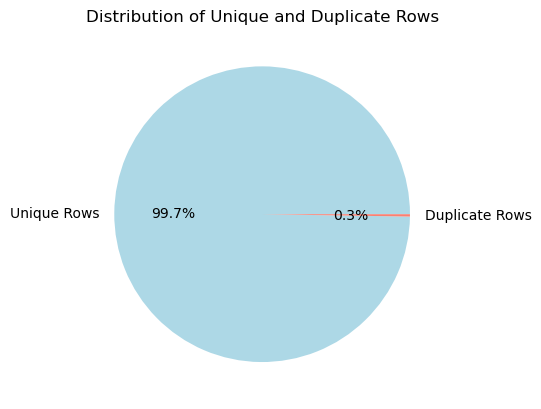

In [19]:
# Data for the pie chart: counts of unique and duplicate rows

counts = [unique_rows, df.duplicated().sum()]  # Unique rows and duplicate rows counts
labels = ['Unique Rows', 'Duplicate Rows']    # Labels for the pie chart sections

# Creating a pie chart

plt.pie(counts, 
        labels=labels,          # Assigning labels to each section
        autopct='%1.1f%%',      # Display percentage values with 1 decimal place
        colors=['lightblue', 'salmon'])  # Custom colors for the sections

# Adding a title to the pie chart

plt.title('Distribution of Unique and Duplicate Rows')

# Displaying the pie chart

plt.show()


In [20]:
# Removing duplicate rows from the DataFrame

df1 = df.drop_duplicates()

# Checking the shape of the new DataFrame (number of rows and columns after removing duplicates)

df1.shape

(19088, 82)

In [21]:
# Calculate the number of duplicate rows removed by comparing the lengths of df and df1

removed_count = len(df) - len(df1)  # The difference in the number of rows represents the duplicates removed.

# Print the number of duplicate rows removed

print(f"Number of duplicate rows removed: {removed_count}")  # Outputs the number of duplicates removed to the console.

Number of duplicate rows removed: 49


In [22]:
# Checking for any remaining duplicate rows in the DataFrame after removing duplicates

df1.duplicated().sum()

0

In [23]:
# Selecting the numeric columns from the DataFrame

numeric_columns = df1.select_dtypes(include=['number']).columns

In [24]:
# Printing the total number of numerical features and their names

print("Total Numerical Features:", numeric_columns.shape[0])  # Get the number of numerical columns
print("Numeric Features:", numeric_columns)  # List the names of numerical columns

Total Numerical Features: 82
Numeric Features: Index(['number_of_elements', 'mean_atomic_mass', 'wtd_mean_atomic_mass',
       'gmean_atomic_mass', 'wtd_gmean_atomic_mass', 'entropy_atomic_mass',
       'wtd_entropy_atomic_mass', 'range_atomic_mass', 'wtd_range_atomic_mass',
       'std_atomic_mass', 'wtd_std_atomic_mass', 'mean_fie', 'wtd_mean_fie',
       'gmean_fie', 'wtd_gmean_fie', 'entropy_fie', 'wtd_entropy_fie',
       'range_fie', 'wtd_range_fie', 'std_fie', 'wtd_std_fie',
       'mean_atomic_radius', 'wtd_mean_atomic_radius', 'gmean_atomic_radius',
       'wtd_gmean_atomic_radius', 'entropy_atomic_radius',
       'wtd_entropy_atomic_radius', 'range_atomic_radius',
       'wtd_range_atomic_radius', 'std_atomic_radius', 'wtd_std_atomic_radius',
       'mean_density', 'wtd_mean_density', 'gmean_density',
       'wtd_gmean_density', 'entropy_density', 'wtd_entropy_density',
       'range_density', 'wtd_range_density', 'std_density', 'wtd_std_density',
       'mean_electronaffinit

In [25]:
# Selecting the categorical (object type) columns from the DataFrame

categorical_columns = df1.select_dtypes(include='object').columns

# Printing the total number of categorical features and their names

print("Total Categorical Features:", categorical_columns.shape[0])  # Get the number of categorical columns
print("Categorical Features:", categorical_columns)  # List the names of categorical columns

Total Categorical Features: 0
Categorical Features: Index([], dtype='object')


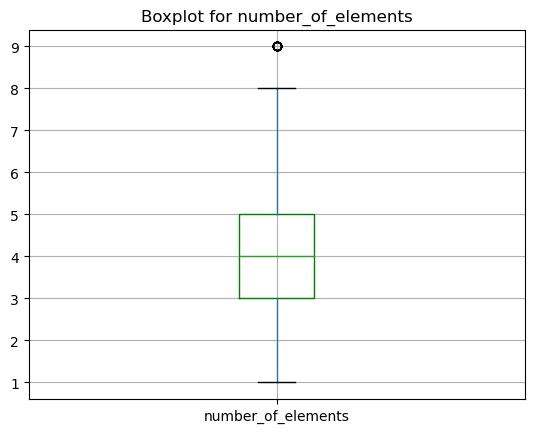

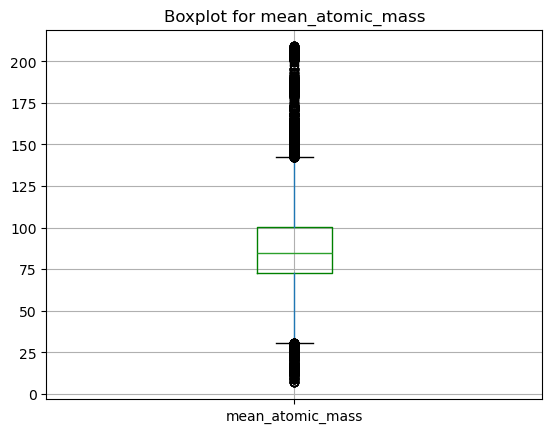

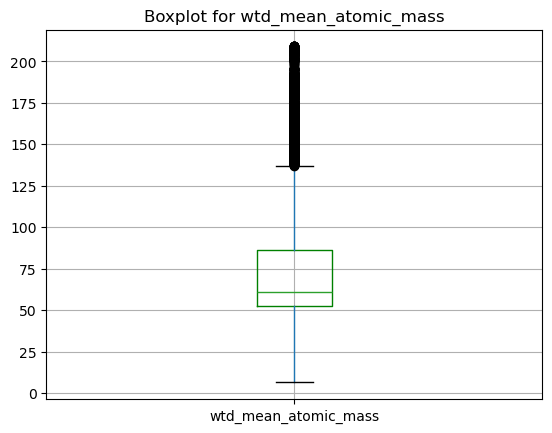

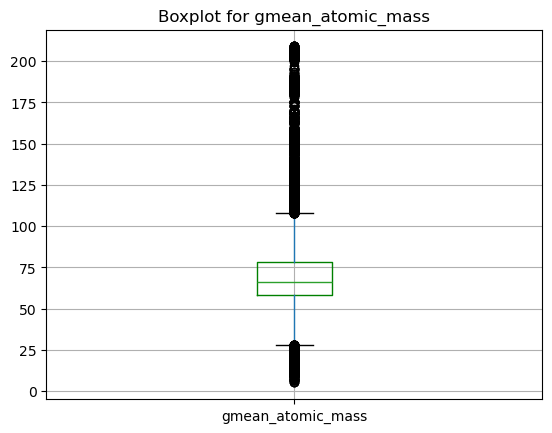

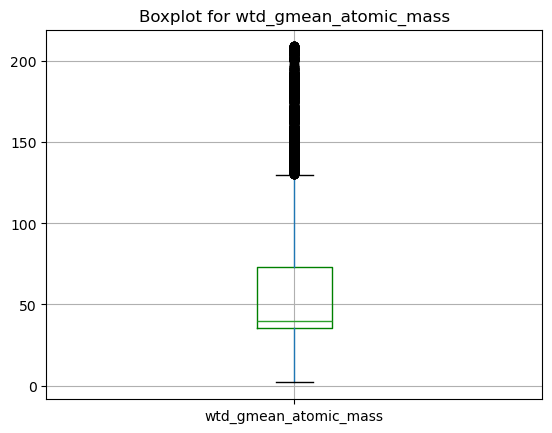

...

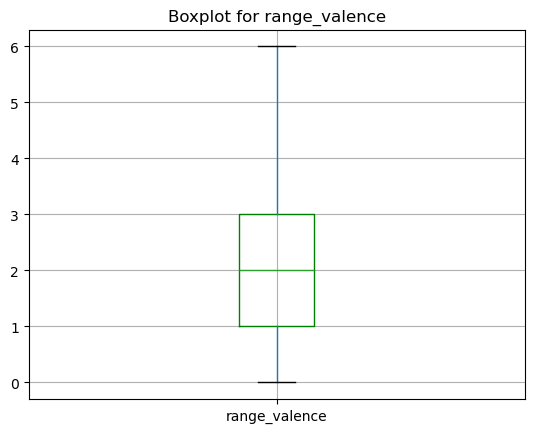

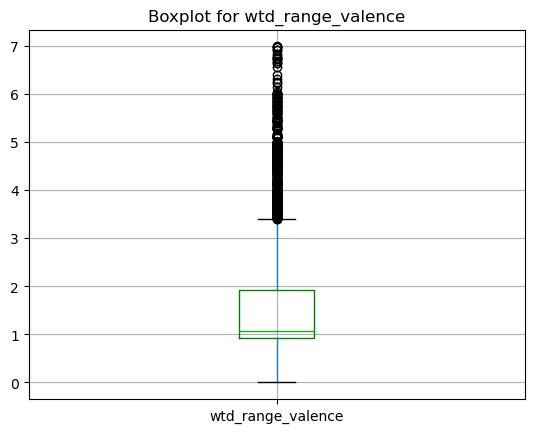

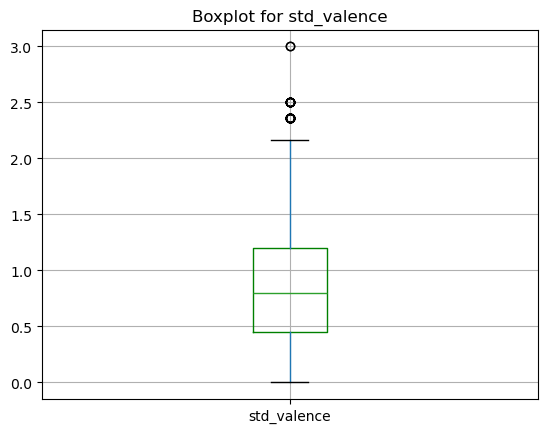

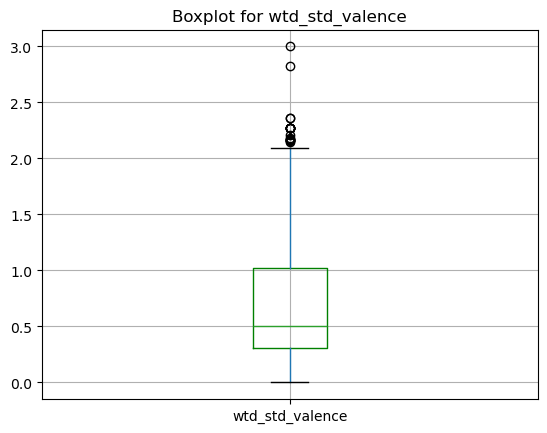

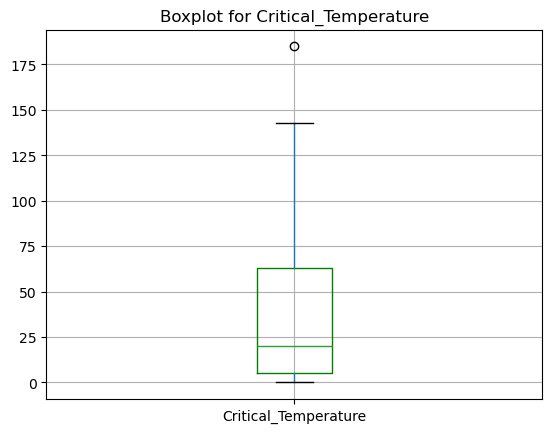

In [26]:
# Separate boxplots for each numeric column in the DataFrame

for column in numeric_columns:
    plt.figure()  # Create a new figure for each boxplot
    df1.boxplot(column=column, boxprops=dict(color='green'))  # Create the boxplot for the numeric column
    plt.title(f"Boxplot for {column}")  # Set the title for the boxplot
    plt.show()  # Display the boxplot

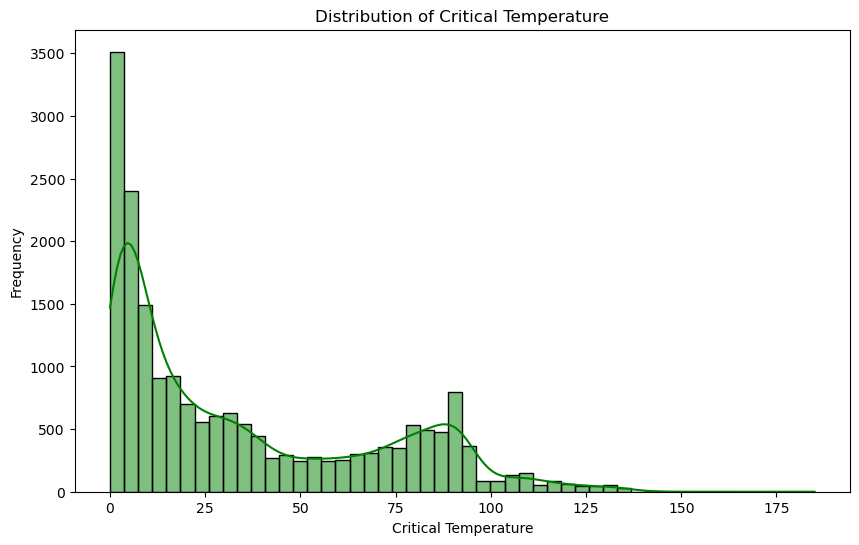

In [36]:
# Generate a histogram for the 'Critical_Temperature' column

plt.figure(figsize=(10, 6))  # Set the figure size for better visualization
sns.histplot(df1['Critical_Temperature'], bins=50, kde=True, color='green')  # Create the histogram with KDE (Kernel Density Estimate)
plt.title('Distribution of Critical Temperature')  # Set the title of the plot
plt.xlabel('Critical Temperature')  # Set the label for the x-axis
plt.ylabel('Frequency')  # Set the label for the y-axis
plt.show()  # Display the plot

***Outliner Handling***

In [38]:
# Calculate Q1 (25th percentile), Q3 (75th percentile), and IQR (Interquartile Range) for numeric columns

Q1 = df1[numeric_columns].quantile(0.25)  # 25th percentile (Q1)
Q3 = df1[numeric_columns].quantile(0.75)  # 75th percentile (Q3)
IQR = Q3 - Q1  # Interquartile Range (IQR) is the difference between Q3 and Q1

In [40]:
# Define the lower and upper bounds for outlier detection based on IQR

lower_bound = Q1 - 1.5 * IQR  # Values below this threshold are considered outliers
upper_bound = Q3 + 1.5 * IQR  # Values above this threshold are considered outliers

In [42]:
# Identify outliers based on the lower and upper bounds for each numeric column

outliers = ((df1[numeric_columns] < lower_bound) | (df1[numeric_columns] > upper_bound))

# Print the number of outliers in each column

print("Number of outliers in each column:\n")
outliers.sum()  # Count the number of True values (outliers) in each column

Number of outliers in each column:



number_of_elements         14
mean_atomic_mass         1436
wtd_mean_atomic_mass     1111
gmean_atomic_mass        3001
wtd_gmean_atomic_mass    1114
                         ... 
range_valence               0
wtd_range_valence        1262
std_valence                41
wtd_std_valence            21
Critical_Temperature        1
Length: 82, dtype: int64

In [44]:
# Define function to handle outliers using IQR (Winsorizing)

def handle_outliers_iqr(df):
    # Loop through each numeric column (int64 and float64 types) in the DataFrame
    for col in df.select_dtypes(include=['int64', 'float64']).columns:
        # Calculate Q1 (25th percentile), Q3 (75th percentile), and IQR (Interquartile Range)
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        
        # Define lower and upper bounds based on IQR
        lower = Q1 - (1.5 * IQR)  # Lower bound
        upper = Q3 + (1.5 * IQR)  # Upper bound


        
        # Cap the outliers using capping (Winsorizing) method
        # If a value is below the lower bound, set it to the lower bound
        # If a value is above the upper bound, set it to the upper bound
        df[col] = df[col].apply(lambda x: lower if x < lower else upper if x > upper else x)

    return df  # Return the DataFrame with handled outliers

# Call the function on df1 to handle outliers and assign the result to df2
df2 = handle_outliers_iqr(df1)

In [46]:
# Print the shape of the DataFrame after handling (capping) outliers

print("Shape after capping outliers:", df2[numeric_columns].shape)

Shape after capping outliers: (19088, 82)


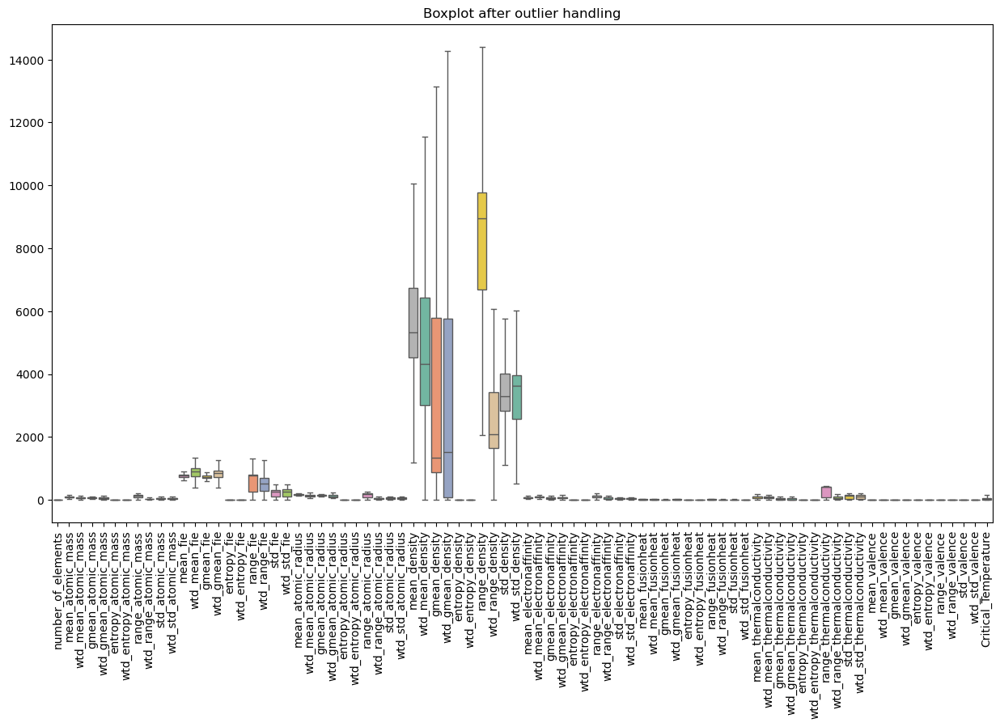

In [48]:
# Generate a boxplot for the DataFrame df2 after handling outliers

plt.figure(figsize=(15, 8))  # Set the size of the plot
sns.boxplot(data=df2, palette='Set2')  # Create a boxplot for all columns in df2
plt.title('Boxplot after outlier handling')  # Set the title for the plot
plt.xticks(rotation=90)  # Rotate the x-axis labels by 90 degrees for better readability
plt.show()  # Display the plot

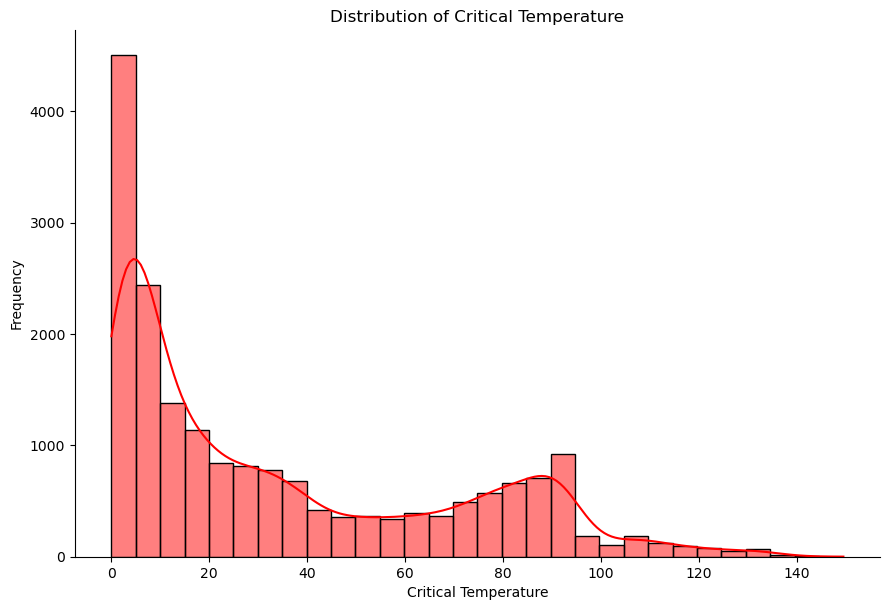

In [52]:
# Generate a distribution plot for the 'Critical_Temperature' column before transformation

sns.displot(df2['Critical_Temperature'], bins=30, kde=True, height=6, aspect=1.5, color ='red')  # Create the distribution plot
plt.title('Distribution of Critical Temperature')  # Set the title of the plot
plt.xlabel('Critical Temperature')  # Set the label for the x-axis
plt.ylabel('Frequency')  # Set the label for the y-axis
plt.show()  # Display the plot

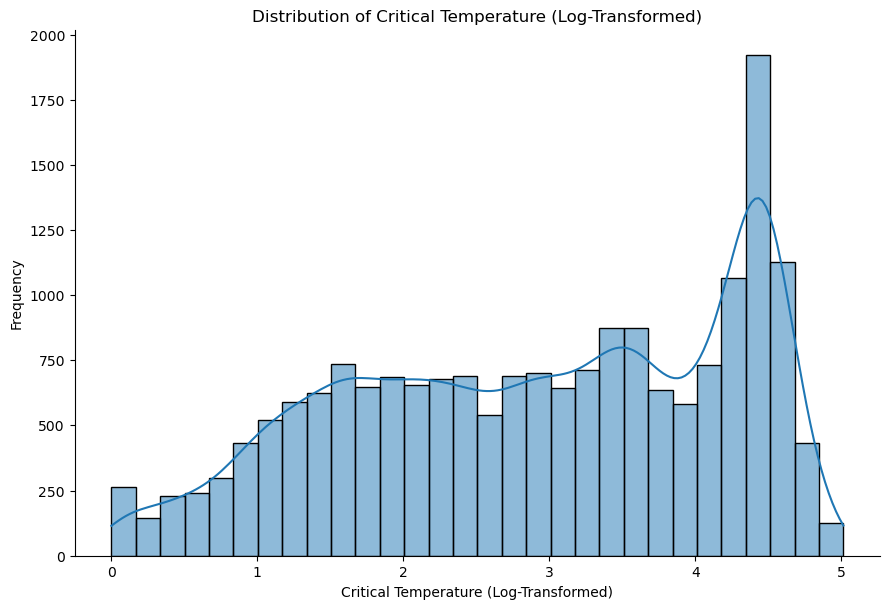

In [58]:
# Apply a log transformation to the 'critical_temperature' column

df2['Critical_Temperature'] = np.log1p(df2['Critical_Temperature'])  # np.log1p adds 1 to the values before applying log transformation

# Generate a distribution plot for the 'critical_temperature' column after log transformation
sns.displot(df2['Critical_Temperature'], bins=30, kde=True, height=6, aspect=1.5)  # Create the distribution plot with histogram and KDE
plt.title('Distribution of Critical Temperature (Log-Transformed)')  # Set the title of the plot
plt.xlabel('Critical Temperature (Log-Transformed)')  # Set the label for the x-axis
plt.ylabel('Frequency')  # Set the label for the y-axis
plt.show()  # Display the plot

***Skewness Addressing***

In [60]:
# Select all numerical columns (int64, float64) from the DataFrame df2

numerical_features = df2.select_dtypes(include=['float64', 'int64']).columns

In [62]:
# Calculate skewness for each numerical feature

skewness = df2[numerical_features].skew()

# Categorize skewness into three categories:
fairly_skewness = skewness[(skewness >= -0.5) & (skewness <= 0.5)]  # Skewness close to 0 (symmetric distribution)
moderate_skewness = skewness[(skewness > 0.5) & (skewness <= 1) | (skewness < -0.5) & (skewness >= -1)]  # Moderate skewness
high_skewness = skewness[(skewness > 1) | (skewness < -1)]  # High skewness (either positive or negative)

In [64]:
# Displaying the skewness values for all numeric columns
print("Skewness of Numeric Columns:\n\n", skewness)

# Displaying the columns with fairly skewed distributions (skewness between -0.5 and 0.5)
print("\nFairly Skewness:\n\n", fairly_skewness)

# Displaying the columns with moderate skewed distributions (skewness between -1 and -0.5 or 0.5 and 1)
print("\nModerate Skewness:\n\n", moderate_skewness)

# Displaying the columns with high skewed distributions (skewness > 1 or skewness < -1)
print("\nHigh Skewness:\n\n", high_skewness)

Skewness of Numeric Columns:

 number_of_elements      -0.002091
mean_atomic_mass         0.242885
wtd_mean_atomic_mass     0.776434
gmean_atomic_mass        0.271968
wtd_gmean_atomic_mass    1.072192
                           ...   
range_valence            0.467760
wtd_range_valence        1.066115
std_valence              0.432837
wtd_std_valence          0.641721
Critical_Temperature    -0.319580
Length: 82, dtype: float64

Fairly Skewness:

 number_of_elements                -0.002091
mean_atomic_mass                   0.242885
gmean_atomic_mass                  0.271968
range_atomic_mass                 -0.376163
std_atomic_mass                   -0.347157
wtd_std_atomic_mass               -0.315268
mean_fie                           0.143999
wtd_mean_fie                      -0.288635
gmean_fie                          0.428406
wtd_gmean_fie                     -0.315962
wtd_entropy_fie                    0.114103
range_fie                         -0.457029
wtd_range_fie       

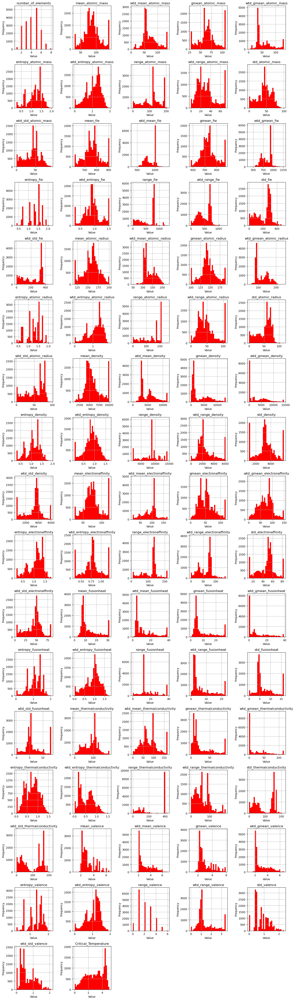

In [66]:
# Set up the number of rows and columns for the subplot grid
n_cols = 5  # Number of columns in the grid (adjustable based on number of features)
n_rows = (df2.shape[1] // n_cols) + (df2.shape[1] % n_cols > 0)  # Calculate number of rows needed to fit all columns

# Create the figure and axes for the subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3 * n_rows))  # Adjust figure size to fit all histograms
axes = axes.flatten()  # Flatten the axes array to make it easier to iterate

# Loop through each column in df2 and plot its histogram
for i, column in enumerate(df2.columns):
    df2[column].hist(ax=axes[i], bins=30, color = 'red')  # Plot histogram for each column with 30 bins
    axes[i].set_title(f'{column}')  # Set title for each subplot as the column name
    axes[i].set_xlabel('Value')  # Set x-axis label
    axes[i].set_ylabel('Frequency')  # Set y-axis label

# Remove any empty subplots if there are more axes than columns
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])  # Remove extra subplots that are not used

# Adjust layout to ensure the plots don't overlap
plt.tight_layout()

# Show the plots
plt.show()

In [70]:
# Apply Yeo-Johnson transformation (works for both positive and negative values)
from sklearn.preprocessing import PowerTransformer

# Create a PowerTransformer object with Yeo-Johnson method
pt = PowerTransformer(method='yeo-johnson')

# Apply the transformation to the numerical features in the dataframe df2
df2[numerical_features] = pt.fit_transform(df2[numerical_features])

# Check the skewness of the numerical columns after transformation
print(df2[numerical_features].skew())

number_of_elements      -0.071109
mean_atomic_mass         0.009359
wtd_mean_atomic_mass     0.043425
gmean_atomic_mass       -0.018427
wtd_gmean_atomic_mass   -0.000235
                           ...   
range_valence           -0.033327
wtd_range_valence       -0.010699
std_valence             -0.010112
wtd_std_valence          0.026710
Critical_Temperature    -0.202391
Length: 82, dtype: float64


In [72]:
df2

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,wtd_mean_valence,gmean_valence,wtd_gmean_valence,entropy_valence,wtd_entropy_valence,range_valence,wtd_range_valence,std_valence,wtd_std_valence,Critical_Temperature
0,-0.064766,0.127924,-0.388276,-0.018420,-0.591590,-0.094263,-0.126873,0.132255,0.226201,0.368104,...,-0.752613,-0.927645,-0.703987,0.057462,-0.102133,-0.807674,-0.250103,-0.821177,-0.407594,0.345024
1,0.621841,0.272362,-0.362178,0.293832,-0.576994,0.790520,-0.139112,0.132255,0.443807,0.120698,...,-0.752613,-1.721521,-0.720687,0.641886,-0.155968,0.090427,-0.184540,-0.347936,-0.321904,0.259485
2,-0.064766,0.127924,-0.387376,-0.018420,-0.591281,-0.094263,-0.349454,0.132255,0.423464,0.368104,...,-0.728454,-0.927645,-0.680563,0.057462,-0.206463,-0.807674,-0.206181,-0.821177,-0.386613,0.018721
3,-0.064766,0.127924,-0.387826,-0.018420,-0.591435,-0.094263,-0.231572,0.132255,0.326355,0.368104,...,-0.740499,-0.927645,-0.692259,0.057462,-0.151425,-0.807674,-0.228035,-0.821177,-0.396880,0.130308
4,-0.064766,0.127924,-0.389177,-0.018420,-0.591898,-0.094263,0.053004,0.132255,0.015564,0.368104,...,-0.777051,-0.927645,-0.727544,0.057462,-0.016211,-0.807674,-0.294899,-0.821177,-0.430426,0.164476
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19132,-0.768944,0.144995,0.717872,-0.144395,0.485494,-1.138752,-0.807106,0.886462,1.240223,1.455710,...,1.281187,1.417992,1.320498,-0.708214,-0.065558,0.090427,-1.013299,0.307047,0.723013,-1.116968
19133,0.621841,0.254788,-0.757815,-0.091369,-0.769558,0.354433,1.417074,1.329729,-1.494438,1.252950,...,-1.141295,-1.022679,-1.062872,0.765414,0.742365,-0.807674,-0.549890,-0.904314,-1.100720,1.537262
19134,-1.495811,0.533423,0.908337,1.422473,1.257394,-1.334975,-1.321558,-1.877074,1.175131,-1.857399,...,1.333267,1.369492,1.393603,-1.503432,-1.509007,-0.807674,1.700873,-0.656892,-0.511603,-1.391366
19135,-1.495811,0.533423,0.952812,1.422473,1.285920,-1.334975,-1.107332,-1.877074,0.190943,-1.857399,...,1.290531,1.369492,1.352747,-1.503432,-1.273817,-0.807674,1.021639,-0.656892,-0.338310,-1.423842


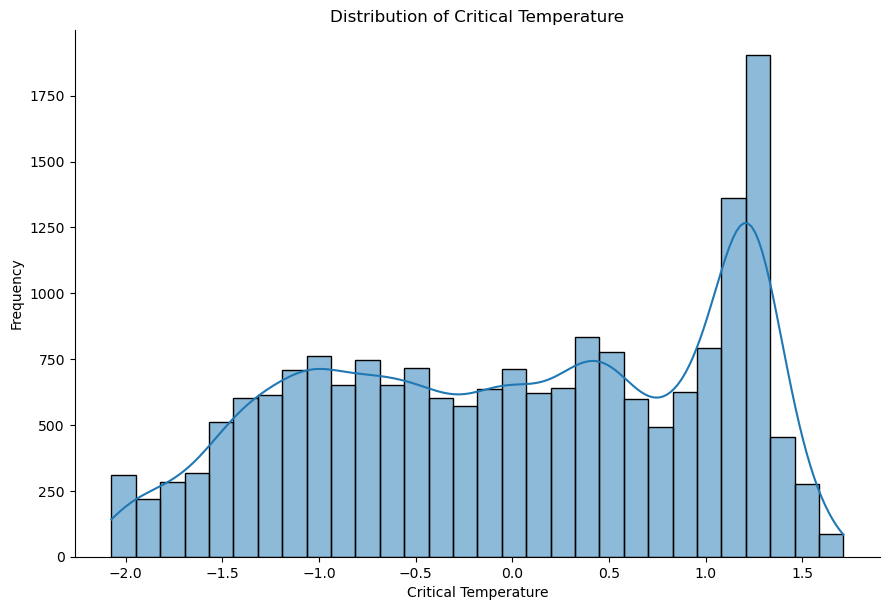

In [76]:
# Distribution plot after applying Yeo-Johnson transformation
sns.displot(df2['Critical_Temperature'], bins=30, kde=True, height=6, aspect=1.5)  # Create the distribution plot with 30 bins
plt.title('Distribution of Critical Temperature')  # Set the title of the plot
plt.xlabel('Critical Temperature')  # Set the label for the x-axis
plt.ylabel('Frequency')  # Set the label for the y-axis
plt.show()  # Display the plot

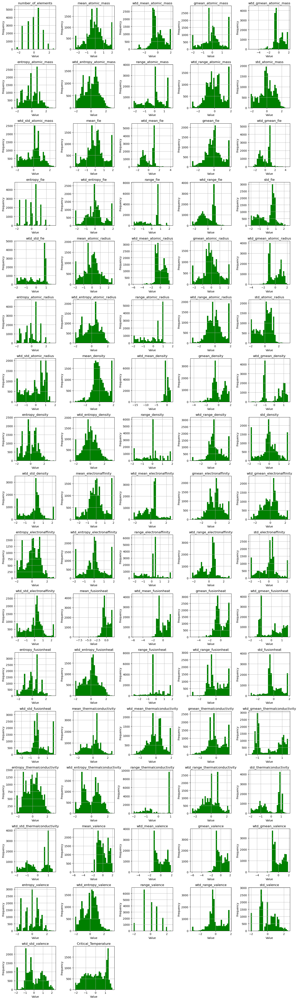

In [78]:
# Plot histograms after transformed features

# Set up the number of rows and columns for the subplot grid
n_cols = 5  # Number of columns in the grid (adjustable based on number of features)
n_rows = (df2.shape[1] // n_cols) + (df2.shape[1] % n_cols > 0)  # Calculate number of rows needed to fit all columns

# Create the figure and axes for the subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3 * n_rows))  # Adjust figure size to fit all histograms
axes = axes.flatten()  # Flatten the axes array to make it easier to iterate over each subplot

# Loop through each column in df2 and plot its histogram
for i, column in enumerate(df2.columns):
    df2[column].hist(ax=axes[i], bins=30, color = 'green')  # Plot histogram for each column with 30 bins
    axes[i].set_title(f'{column}')  # Set title for each subplot as the column name
    axes[i].set_xlabel('Value')  # Set x-axis label
    axes[i].set_ylabel('Frequency')  # Set y-axis label

# Remove any empty subplots if there are more axes than columns
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])  # Remove extra subplots that are not used

# Adjust layout to ensure the plots don't overlap
plt.tight_layout()

# Show the plots
plt.show()

## 6. **Exploratory Data Analysis (EDA):**

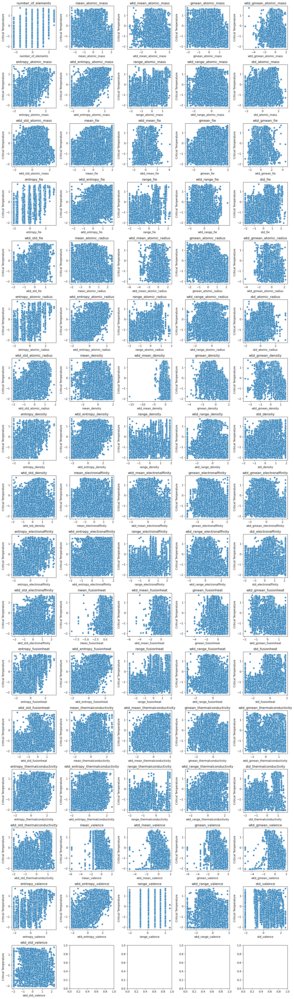

In [80]:
# Generates scatter plots for each numerical feature against 'Critical_Temperature'

# List of numerical features (excluding 'Critical_Temperature')
num_cols = [col for col in df2.columns if col != 'Critical_Temperature']

# Set up the number of rows and columns for the subplot grid
n_cols = 5  # Number of columns in the grid (adjustable based on number of features)
n_rows = (df2.shape[1] // n_cols) + (df2.shape[1] % n_cols > 0)  # Calculate the required number of rows for the grid

# Create the figure and axes for the subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3 * n_rows))  # Adjust figure size to fit all scatter plots
axes = axes.flatten()  # Flatten the axes array for easier iteration

# Loop through each numerical feature and create a scatter plot against 'Critical_Temperature'
for i, col in enumerate(num_cols):
    plt.subplot(n_rows, n_cols, i + 1)  # Position the scatter plot in the subplot grid
    sns.scatterplot(data=df2, x=col, y='Critical_Temperature')  # Create scatter plot
    plt.title(col)  # Set title as the column name
    plt.xlabel(col)  # Set the x-axis label as the column name
    plt.ylabel('Critical Temperature')  # Set the y-axis label as 'Critical Temperature'

# Adjust layout for better spacing and presentation
plt.tight_layout()

# Save the plot as an image (optional)
plt.savefig("Scatter.png")

# Display the plot
plt.show()

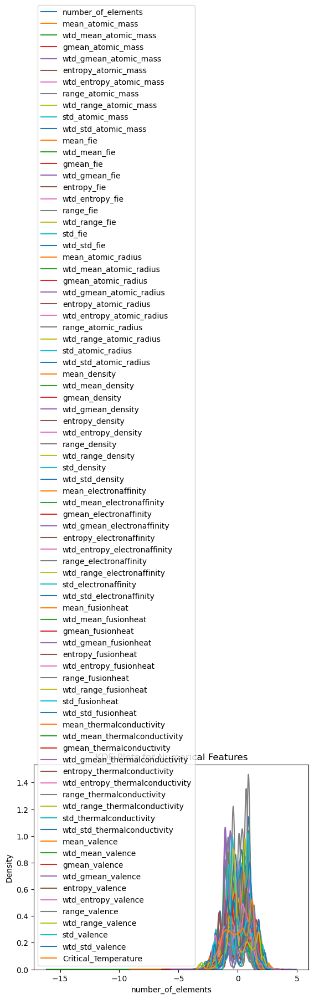

In [82]:
# To generate Kernel Density Estimate (KDE) plot for numerical features

# Loop through each numerical feature (columns with 'float64' or 'int64' data types)
for column in df2.select_dtypes(include=['float64', 'int64']).columns:
    sns.kdeplot(df2[column], label=column)  # Generate KDE plot for the column

# Add a legend to differentiate between the columns
plt.legend()

# Set the title for the plot
plt.title('KDE Plots for Numerical Features')

# Display the plot
plt.show()

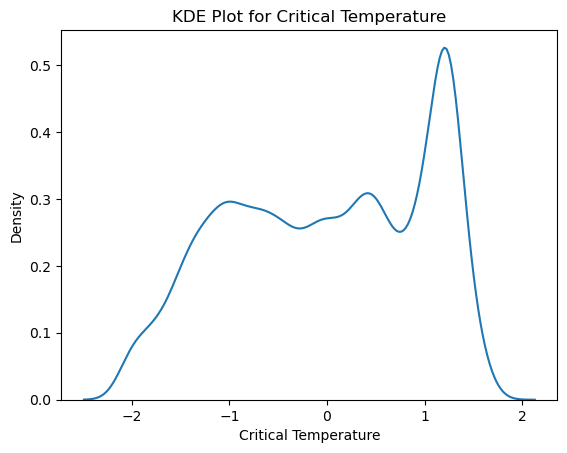

In [84]:
# To generate Kernel Density Estimate (KDE) plot for the target variable 'Critical_Temperature'

sns.kdeplot(df2['Critical_Temperature'])
plt.title('KDE Plot for Critical Temperature')  # Set the title of the plot
plt.xlabel('Critical Temperature')  # Label for the x-axis
plt.ylabel('Density')  # Label for the y-axis (Density)
plt.show()  # Display the plot

In [86]:
# Calculate the correlation matrix for the numerical columns

corr1 = df2[numeric_columns].corr()

# Display the correlation matrix
print("Correlation Matrix:\n", corr1)

Correlation Matrix:
                        number_of_elements  mean_atomic_mass  \
number_of_elements               1.000000         -0.084596   
mean_atomic_mass                -0.084596          1.000000   
wtd_mean_atomic_mass            -0.262715          0.771168   
gmean_atomic_mass               -0.187248          0.916314   
wtd_gmean_atomic_mass           -0.343755          0.654549   
...                                   ...               ...   
range_valence                    0.255627         -0.099650   
wtd_range_valence               -0.332918          0.105141   
std_valence                      0.137854         -0.073540   
wtd_std_valence                  0.073554         -0.087224   
Critical_Temperature             0.674584         -0.190188   

                       wtd_mean_atomic_mass  gmean_atomic_mass  \
number_of_elements                -0.262715          -0.187248   
mean_atomic_mass                   0.771168           0.916314   
wtd_mean_atomic_mass    

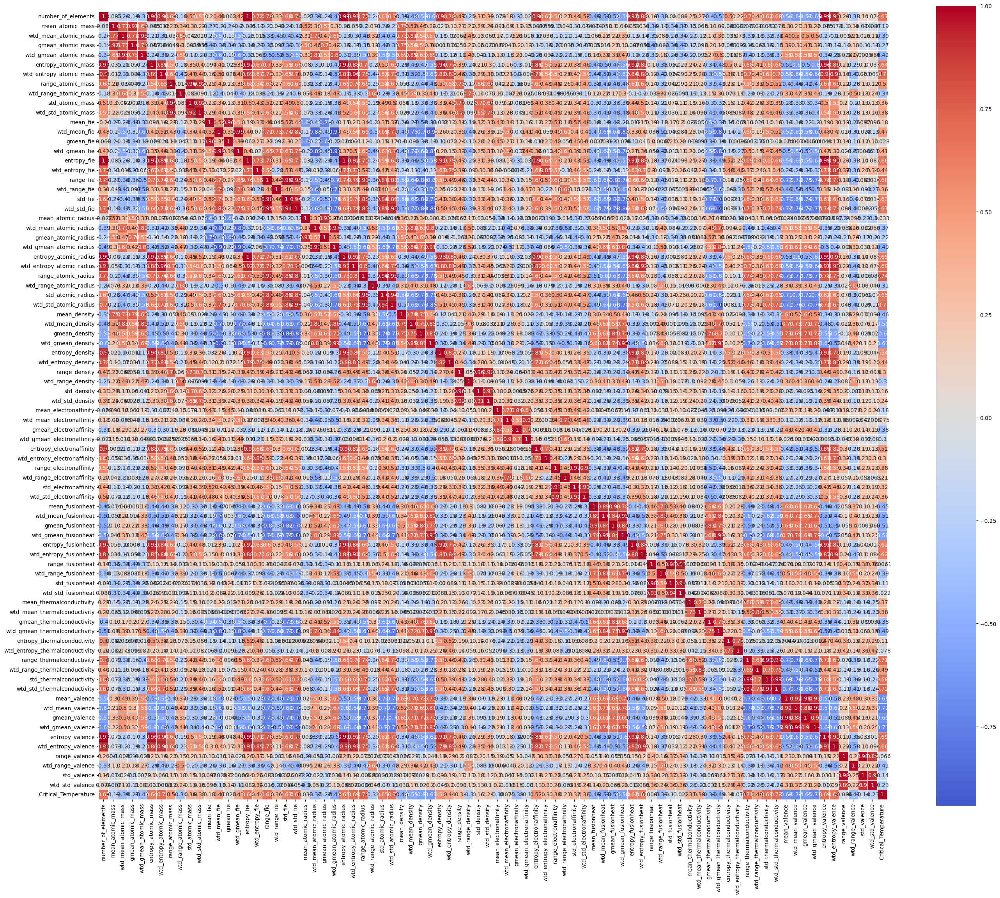

In [88]:
# Create the heatmap with annotations

plt.figure(figsize=(28, 28))  # Set the size of the figure
sns.heatmap(corr1, annot=True, cmap='coolwarm', center=0, linewidths=0.5, cbar_kws={"shrink": 0.75}, square=True)

# Rotate x-axis and y-axis labels to make them readable
plt.xticks(rotation=90)  # Rotate x-axis labels by 90 degrees
plt.yticks(rotation=0)   # Keep y-axis labels horizontal

# Save the heatmap as an image
plt.savefig("corr.png")

# Adjust layout to avoid overlap
plt.tight_layout()

# Display the heatmap
plt.show()

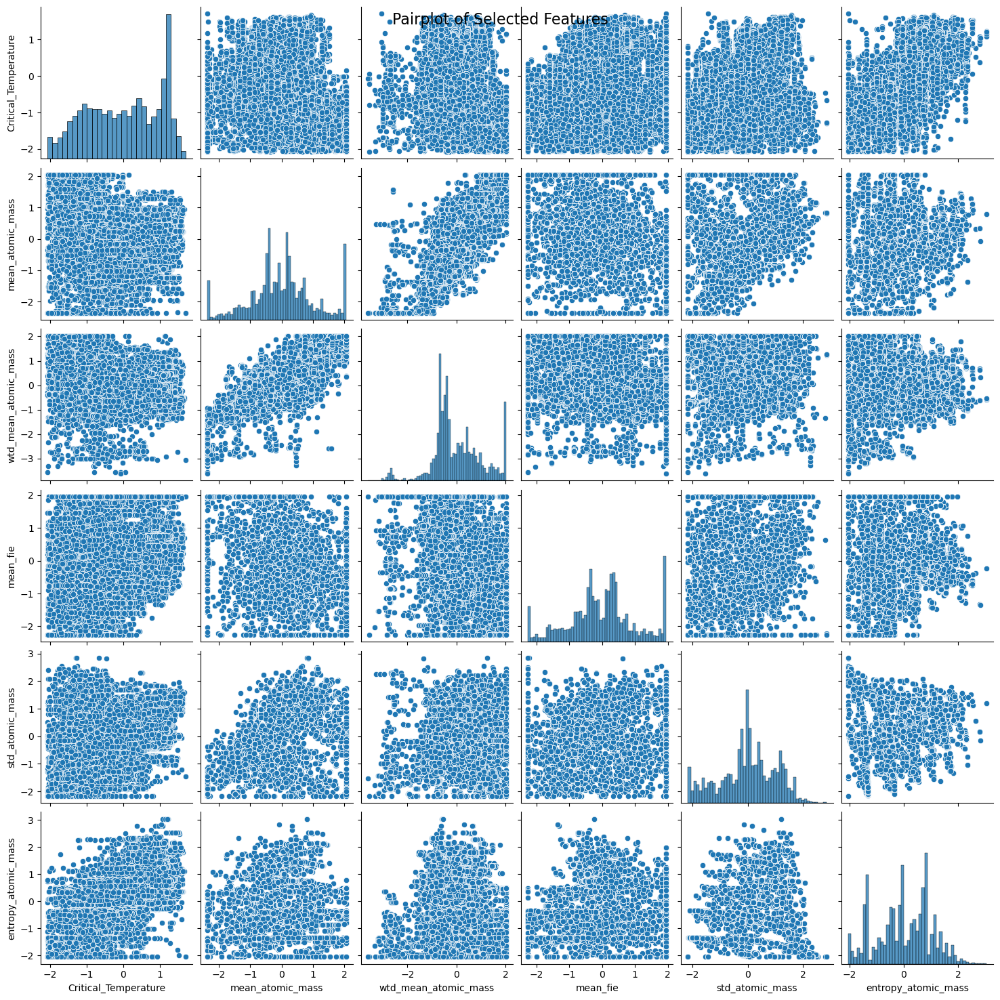

In [90]:
# Select a subset of features for the pairplot
subset = df2[['Critical_Temperature', 'mean_atomic_mass', 'wtd_mean_atomic_mass', 'mean_fie', 'std_atomic_mass', 'entropy_atomic_mass']]

# Generate the pairplot for the selected features
sns.pairplot(subset)

# Set the title for the pairplot
plt.suptitle("Pairplot of Selected Features", size=16)

# Display the pairplot
plt.show()

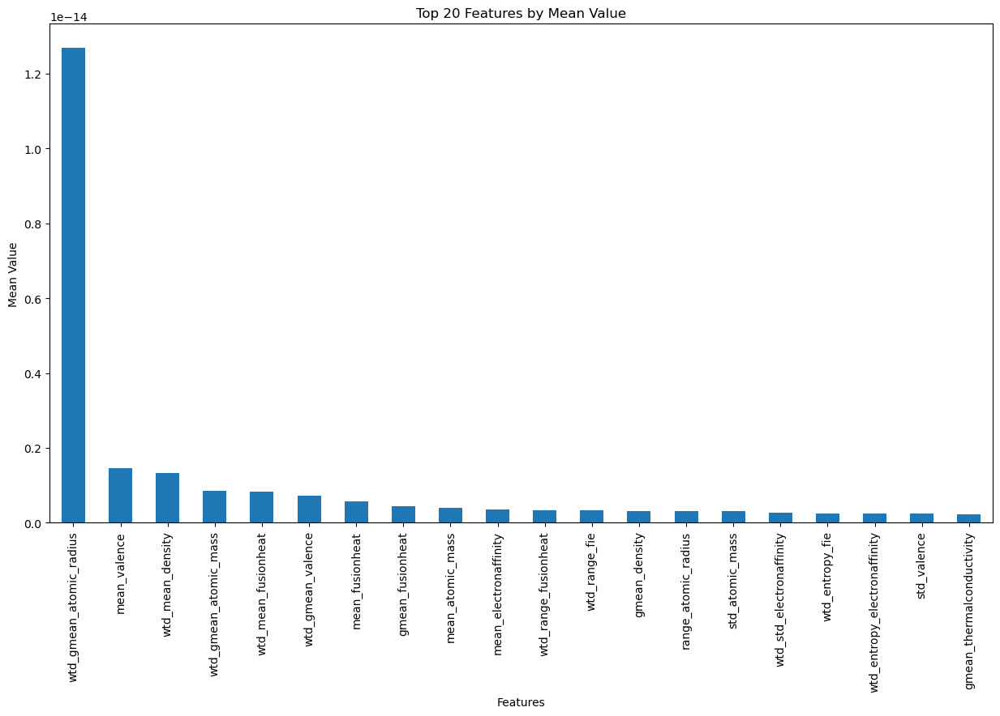

In [92]:
# Calculate the mean of each feature
mean_values = df2.mean()

# Sort the mean values in descending order and select the top 20
mean_values.sort_values(ascending=False).head(20).plot(kind='bar', figsize=(15, 8))

# Set the title and labels for the plot
plt.title("Top 20 Features by Mean Value")
plt.xlabel("Features")
plt.ylabel("Mean Value")

# Display the bar plot
plt.show()

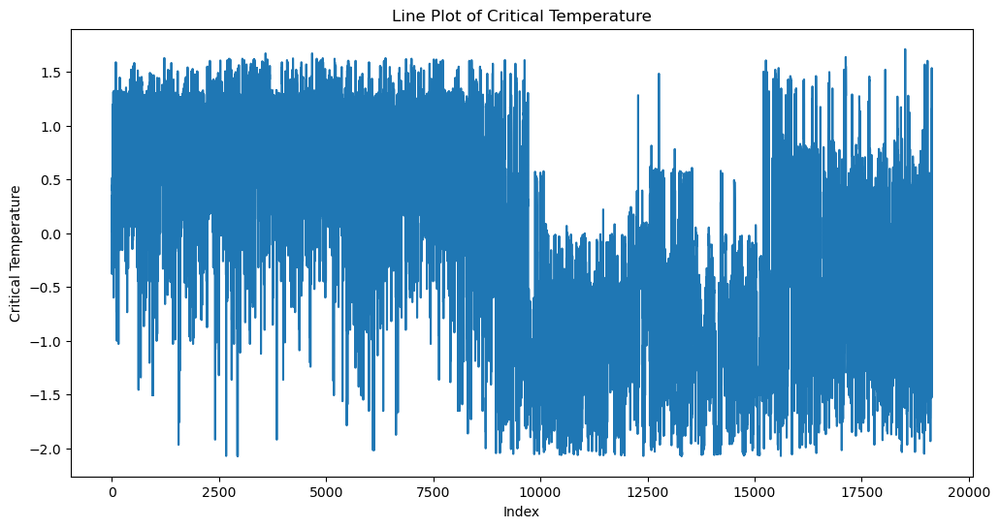

In [94]:
# Generate a line plot for 'Critical_Temperature' over the index
plt.figure(figsize=(12, 6))  # Set the size of the figure
sns.lineplot(data=df2['Critical_Temperature'])  # Create the line plot for the 'Critical_Temperature' column

# Set the title and labels for the plot
plt.title('Line Plot of Critical Temperature')
plt.xlabel('Index')  # X-axis represents the index of the DataFrame
plt.ylabel('Critical Temperature')  # Y-axis represents the 'Critical_Temperature' values

# Display the plot
plt.show()

## 7. **Feature Engineering:**

In [96]:
# Identify categorical features by selecting columns with 'object' or 'category' data types
categorical_columns = df2.select_dtypes(include=['object', 'category']).columns

# Print the categorical columns
print("Categorical Columns:", categorical_columns)

Categorical Columns: Index([], dtype='object')


## 8. **Feature Selection:**

**Setting Target Value**

In [100]:
# Feature matrix (X) excluding the target column
x = df2.drop(columns=['Critical_Temperature'])

# Target vector (y) containing only the 'Critical_Temperature' column
y = df2['Critical_Temperature']

In [104]:
# Display the first few rows of the feature matrix 'x'
x.head()

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,entropy_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,std_atomic_mass,...,mean_valence,wtd_mean_valence,gmean_valence,wtd_gmean_valence,entropy_valence,wtd_entropy_valence,range_valence,wtd_range_valence,std_valence,wtd_std_valence
0,-0.064766,0.127924,-0.388276,-0.018420,-0.591590,-0.094263,-0.126873,0.132255,0.226201,0.368104,...,-1.068221,-0.752613,-0.927645,-0.703987,0.057462,-0.102133,-0.807674,-0.250103,-0.821177,-0.407594
1,0.621841,0.272362,-0.362178,0.293832,-0.576994,0.790520,-0.139112,0.132255,0.443807,0.120698,...,-1.619725,-0.752613,-1.721521,-0.720687,0.641886,-0.155968,0.090427,-0.184540,-0.347936,-0.321904
2,-0.064766,0.127924,-0.387376,-0.018420,-0.591281,-0.094263,-0.349454,0.132255,0.423464,0.368104,...,-1.068221,-0.728454,-0.927645,-0.680563,0.057462,-0.206463,-0.807674,-0.206181,-0.821177,-0.386613
3,-0.064766,0.127924,-0.387826,-0.018420,-0.591435,-0.094263,-0.231572,0.132255,0.326355,0.368104,...,-1.068221,-0.740499,-0.927645,-0.692259,0.057462,-0.151425,-0.807674,-0.228035,-0.821177,-0.396880
4,-0.064766,0.127924,-0.389177,-0.018420,-0.591898,-0.094263,0.053004,0.132255,0.015564,0.368104,...,-1.068221,-0.777051,-0.927645,-0.727544,0.057462,-0.016211,-0.807674,-0.294899,-0.821177,-0.430426


***Select KBest, f_Regression***

In [107]:
# Apply SelectKBest with the F-test for regression, selecting all features
k_best = SelectKBest(score_func=f_regression, k='all')  # Select all features
x_new = k_best.fit_transform(x, y)  # Apply the transformation to the feature matrix 'x' and target 'y'

In [109]:
# Get the scores for each feature

scores = k_best.scores_

In [111]:
# Create a DataFrame with feature names and their corresponding scores
feature_scores = pd.DataFrame({"Feature": x.columns, "Score": scores})

# Sort the DataFrame based on the scores in descending order
feature_scores = feature_scores.sort_values(by="Score", ascending=False)

# Display the feature scores
print(feature_scores.head(20))

                        Feature         Score
27          range_atomic_radius  23162.889949
72             wtd_mean_valence  21019.767715
70  wtd_std_thermalconductivity  21015.033237
74            wtd_gmean_valence  19717.244057
67    range_thermalconductivity  19574.218645
6       wtd_entropy_atomic_mass  18023.919267
30        wtd_std_atomic_radius  17891.806839
75              entropy_valence  17727.235300
26    wtd_entropy_atomic_radius  17364.933438
17                    range_fie  16668.719283
71                 mean_valence  16517.232062
69      std_thermalconductivity  16226.466072
0            number_of_elements  15938.283940
20                  wtd_std_fie  15425.451411
15                  entropy_fie  14889.481346
76          wtd_entropy_valence  14844.712471
73                gmean_valence  14199.483846
29            std_atomic_radius  14154.024087
25        entropy_atomic_radius  13905.959899
5           entropy_atomic_mass  13064.342579


***Removing redundant or irrelevant features***

In [114]:
# Calculate the correlation matrix
corr_matrix = df2.corr()

In [116]:
# Set a correlation threshold (e.g., 0.95 for high correlation)
threshold = 0.95

# Get the indices of the upper triangle of the correlation matrix (since it's symmetrical)
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

# Find columns with correlation greater than the threshold
to_drop = [column for column in upper.columns if any(upper[column] > threshold)]

In [118]:
# Print the features that are highly correlated and should be dropped
print("Redundant features to drop:", to_drop)

Redundant features to drop: ['entropy_atomic_mass', 'std_atomic_mass', 'gmean_fie', 'wtd_gmean_fie', 'entropy_fie', 'std_fie', 'wtd_gmean_atomic_radius', 'entropy_atomic_radius', 'wtd_entropy_atomic_radius', 'std_atomic_radius', 'wtd_std_atomic_radius', 'std_density', 'std_electronaffinity', 'std_fusionheat', 'std_thermalconductivity', 'wtd_std_thermalconductivity', 'gmean_valence', 'wtd_gmean_valence', 'entropy_valence', 'std_valence']


In [124]:
# Drop the redundant features
df3 = df2.drop(columns=to_drop)

In [134]:
print("New DataFrame Shape:", df3.shape,'\n')
print("Descriptive Statistics:\n")
df3.describe()

New DataFrame Shape: (19088, 62) 

Descriptive Statistics:



,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,wtd_std_atomic_mass,mean_fie,...,wtd_entropy_thermalconductivity,range_thermalconductivity,wtd_range_thermalconductivity,mean_valence,wtd_mean_valence,wtd_entropy_valence,range_valence,wtd_range_valence,wtd_std_valence,Critical_Temperature
count,1.908800e+04,1.908800e+04,1.908800e+04,1.908800e+04,1.908800e+04,1.908800e+04,1.908800e+04,1.908800e+04,1.908800e+04,1.908800e+04,...,1.908800e+04,1.908800e+04,1.908800e+04,1.908800e+04,1.908800e+04,1.908800e+04,1.908800e+04,1.908800e+04,1.908800e+04,1.908800e+04
mean,1.146517e-16,3.990475e-16,-2.799288e-16,-2.129246e-16,8.457424e-16,1.965458e-16,-2.114356e-16,-1.191186e-16,-4.079814e-16,-1.715309e-15,...,2.382373e-17,-2.382373e-17,-2.620610e-16,1.453248e-15,-2.382373e-16,-2.851403e-16,-7.147119e-17,4.764746e-17,9.529492e-17,-1.429424e-16
std,1.000026e+00,1.000026e+00,1.000026e+00,1.000026e+00,1.000026e+00,1.000026e+00,1.000026e+00,1.000026e+00,1.000026e+00,1.000026e+00,...,1.000026e+00,1.000026e+00,1.000026e+00,1.000026e+00,1.000026e+00,1.000026e+00,1.000026e+00,1.000026e+00,1.000026e+00,1.000026e+00
min,-2.254368e+00,-2.359746e+00,-3.620224e+00,-2.067969e+00,-5.545602e+00,-2.108555e+00,-2.127865e+00,-2.725956e+00,-2.080505e+00,-2.257536e+00,...,-1.990101e+00,-2.014673e+00,-2.389306e+00,-5.726901e+00,-4.848338e+00,-2.132359e+00,-2.046807e+00,-3.059706e+00,-1.944664e+00,-2.074044e+00
25%,-7.689435e-01,-5.193710e-01,-6.214344e-01,-4.204224e-01,-6.365768e-01,-8.188068e-01,-6.790338e-01,-6.734498e-01,-6.489049e-01,-5.704763e-01,...,-9.037205e-01,-9.633756e-01,-7.150164e-01,-9.073313e-01,-1.005680e+00,-8.444914e-01,-8.076737e-01,-5.230871e-01,-7.866637e-01,-8.581004e-01
50%,-6.476647e-02,-3.029927e-02,-2.725559e-01,-1.842024e-02,-4.031999e-01,1.026685e-01,1.322553e-01,-4.962770e-02,1.406042e-01,3.869616e-02,...,1.265489e-01,9.075949e-01,5.379011e-02,-1.227604e-01,-2.287469e-01,2.000588e-01,9.042652e-02,-2.858685e-01,-2.390973e-01,5.756702e-02
75%,6.218411e-01,5.590898e-01,6.141840e-01,5.105116e-01,7.489633e-01,7.304540e-01,7.033817e-01,5.517437e-01,6.084948e-01,4.755594e-01,...,7.959150e-01,9.075949e-01,8.187797e-01,9.776268e-01,9.737906e-01,7.250194e-01,8.204560e-01,7.578832e-01,8.619110e-01,9.746876e-01
max,2.604572e+00,2.052068e+00,2.025832e+00,1.764067e+00,1.846411e+00,2.861082e+00,1.687560e+00,1.821352e+00,2.494003e+00,1.948093e+00,...,2.561688e+00,1.049816e+00,2.319593e+00,1.993464e+00,1.862871e+00,3.205293e+00,2.500939e+00,1.814525e+00,2.235272e+00,1.713230e+00


In [142]:
# Display the column names of the updated DataFrame df3
df3.columns

Index(['number_of_elements', 'mean_atomic_mass', 'wtd_mean_atomic_mass',
       'gmean_atomic_mass', 'wtd_gmean_atomic_mass', 'wtd_entropy_atomic_mass',
       'range_atomic_mass', 'wtd_range_atomic_mass', 'wtd_std_atomic_mass',
       'mean_fie', 'wtd_mean_fie', 'wtd_entropy_fie', 'range_fie',
       'wtd_range_fie', 'wtd_std_fie', 'mean_atomic_radius',
       'wtd_mean_atomic_radius', 'gmean_atomic_radius', 'range_atomic_radius',
       'wtd_range_atomic_radius', 'mean_density', 'wtd_mean_density',
       'gmean_density', 'wtd_gmean_density', 'entropy_density',
       'wtd_entropy_density', 'range_density', 'wtd_range_density',
       'wtd_std_density', 'mean_electronaffinity', 'wtd_mean_electronaffinity',
       'gmean_electronaffinity', 'wtd_gmean_electronaffinity',
       'entropy_electronaffinity', 'wtd_entropy_electronaffinity',
       'range_electronaffinity', 'wtd_range_electronaffinity',
       'wtd_std_electronaffinity', 'mean_fusionheat', 'wtd_mean_fusionheat',
       'gmea

## 9. **Split Data into Training and Testing Sets:**

In [145]:
# Feature matrix and target variable

X = df3.drop(columns=['Critical_Temperature'])  # Features (independent variables)
Y = df3['Critical_Temperature']  # Target (dependent variable)

In [147]:
# Split the data into training (70%) and temporary set (30%)
X_train, X_temp, y_train, y_temp = train_test_split(X, Y, test_size=0.3, random_state=42)

# Now, split the temporary set into testing (20%) and validation (10%)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=2/3, random_state=42)

# Now we have:
# 70% training data: X_train, y_train
# 10% validation data: X_val, y_val
# 20% testing data: X_test, y_test

X_train shape: (13361, 61)
X_val shape: (1909, 61)
X_test shape: (3818, 61)


In [149]:
# Print the shape of the training, validation, and testing sets
print("Training features shape:", X_train.shape)
print("Validation features shape:", X_val.shape)
print("Testing features shape:", X_test.shape)
print("Training target shape:", y_train.shape)
print("Validation target shape:", y_val.shape)
print("Testing target shape:", y_test.shape)

Training features shape: (13361, 61)
Validation features shape: (1909, 61)
Testing features shape: (3818, 61)
Training target shape: (13361,)
Validation target shape: (1909,)
Testing target shape: (3818,)


## 10. **Feature Scaling:**

In [152]:
# Instantiate the StandardScaler

scaler = StandardScaler()  
# Create an object of the StandardScaler class, which will standardize features by removing the mean and scaling them to unit variance.

In [154]:
# Fit and transform the training data
X_train_scaled = scaler.fit_transform(X_train)  # Fit on training data and scale it

# Transform the test data and validation data (using the same scaler, no fitting)
X_test_scaled = scaler.transform(X_test)  # Scale test data
X_val_scaled = scaler.transform(X_val)  # Scale validation data

In [156]:
# The list of selected features, make sure it matches the number of features in X_train_scaled

selected_features = X_train.columns.tolist()  # Convert the column names of X_train into a list to keep track of the selected features

In [164]:
# To check the transformed data

X_standardized = pd.DataFrame(X_train_scaled, columns=selected_features)  # Convert the scaled data back into a DataFrame, using the selected feature names as column labels
X_standardized  # Display the transformed data

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,wtd_std_atomic_mass,mean_fie,...,entropy_thermalconductivity,wtd_entropy_thermalconductivity,range_thermalconductivity,wtd_range_thermalconductivity,mean_valence,wtd_mean_valence,wtd_entropy_valence,range_valence,wtd_range_valence,wtd_std_valence
0,0.624463,0.387398,0.217004,0.198556,0.265380,0.583716,1.101682,0.196902,0.282695,1.681982,...,1.277656,1.663042,-0.489191,-1.132401,0.844312,0.500844,1.081688,1.441812,-0.168668,1.080783
1,-1.501432,-1.442466,-1.039846,-1.784798,-1.154061,-1.465186,-0.715789,0.048823,-0.195846,1.213550,...,-1.179109,-0.839060,-0.678495,0.521725,0.602040,0.722635,-1.159314,-0.797699,-0.076883,-0.256956
2,-1.501432,-1.963733,-0.733247,-1.526149,-0.005404,-1.940398,-1.688606,0.905813,-1.793957,-2.275568,...,-1.128659,0.386996,-0.142842,-1.274592,0.985693,1.369401,-1.957771,0.094556,1.818093,-0.296239
3,-0.771735,-1.492529,0.302044,-1.287687,0.625350,-1.694004,-0.917034,1.779536,-0.652719,-1.311576,...,0.709020,0.735863,-0.285755,0.004019,0.985693,1.222551,-1.442359,0.094556,1.818093,0.559530
4,-0.064817,1.313482,1.607850,1.780812,1.673224,0.251535,-0.658337,0.964109,-0.852044,-1.258803,...,1.447021,1.094357,-1.249135,-0.552342,0.602040,0.822301,0.062395,-0.797699,0.659915,-0.409669
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13356,-1.501432,2.066707,2.037511,1.780812,1.859092,-1.092251,-0.608074,0.692940,-0.010312,-0.343345,...,-0.168003,0.523533,-1.288481,-0.869157,1.869211,1.696490,-1.039088,-2.028767,-3.058879,-1.929844
13357,-0.771735,1.423275,1.704880,0.293265,0.752711,-0.740362,0.968666,1.309119,1.871464,0.614716,...,0.439283,1.054135,-0.722525,-0.414383,1.192011,1.142290,-0.023776,-0.797699,-1.849541,-0.305715
13358,0.624463,0.149181,-0.568172,0.184442,-0.611561,0.935582,0.163630,-0.603303,0.268613,-0.335725,...,-0.837332,-1.080262,0.904516,0.830784,-0.445642,-1.001186,0.647456,0.094556,-0.454705,-0.435514
13359,-0.064817,-0.355985,-0.657834,-0.348197,-0.649800,0.521613,0.098108,-0.859984,0.129904,0.432438,...,-1.198707,-1.086510,0.904516,0.825298,-1.058722,-1.076515,0.305810,-0.797699,-0.653746,-0.909109


## 11. **Build the ML Model:** (at least 5)

In [167]:
# Define models
models = {
    # Linear Regression model (a basic regression model)
    "Linear Regression": LinearRegression(),
    
    # Lasso Regression model with regularization (alpha controls the strength of regularization)
    "Lasso Regression": Lasso(alpha=0.01),  # Default alpha=1. Adjust as needed.
    
    # Ridge Regression model with regularization (alpha controls the strength of regularization)
    "Ridge Regression": Ridge(alpha=0.1),   # Default alpha=1. Adjust as needed.
    
    # Support Vector Regressor using Radial Basis Function (RBF) kernel
    "Support Vector Regressor": SVR(kernel='rbf'),
    
    # Random Forest Regressor, ensemble method with 100 decision trees
    "Random Forest Regressor": RandomForestRegressor(n_estimators=100, random_state=42),
    
    # Gradient Boosting Regressor, ensemble method that builds trees sequentially
    "Gradient Boosting Regressor": GradientBoostingRegressor(n_estimators=100, random_state=42),
    
    # AdaBoost Regressor, an ensemble method that combines weak learners
    "AdaBoost Regressor": AdaBoostRegressor(n_estimators=50, random_state=42),
    
    # Multi-layer Perceptron Regressor, a neural network-based regressor
    "MLP Regressor": MLPRegressor(hidden_layer_sizes=(50, 50), max_iter=500, random_state=42),
    
    # Decision Tree Regressor, a single decision tree-based model
    "Decision Tree Regressor": DecisionTreeRegressor(random_state=42),
}

## 12. **Model Evaluation:**

In [170]:
# Store results in a dictionary to keep track of each model's performance
results = {}

# Train and evaluate each model
for name, model in models.items():
    print(f"Training and evaluating model: {name}")
    
    # Train the model with scaled training data
    model.fit(X_train_scaled, y_train)
    
    # Make predictions on the test data
    y_pred = model.predict(X_test_scaled)
    
    # Calculate performance metrics for the model
    mse = mean_squared_error(y_test, y_pred)  # Mean Squared Error
    rmse = np.sqrt(mse)  # Root Mean Squared Error
    r2 = r2_score(y_test, y_pred)  # R-squared (Goodness of fit)
    mae = mean_absolute_error(y_test, y_pred)  # Mean Absolute Error
    
    # Store the calculated performance metrics in the 'results' dictionary
    results[name] = {"MSE": mse, "RMSE": rmse, "R2": r2, "MAE": mae}

# Print out the results for all models after evaluation
for model_name, metrics in results.items():
    print(f"{model_name}:")
    for metric, value in metrics.items():
        print(f"  {metric}: {value:.4f}")
    print("-" * 40)

Training and evaluating model: Linear Regression
Training and evaluating model: Lasso Regression
Training and evaluating model: Ridge Regression
Training and evaluating model: Support Vector Regressor
Training and evaluating model: Random Forest Regressor
Training and evaluating model: Gradient Boosting Regressor
Training and evaluating model: AdaBoost Regressor
Training and evaluating model: MLP Regressor
Training and evaluating model: Decision Tree Regressor
Linear Regression:
  MSE: 0.2585
  RMSE: 0.5085
  R2: 0.7374
  MAE: 0.3953
----------------------------------------
Lasso Regression:
  MSE: 0.2851
  RMSE: 0.5340
  R2: 0.7104
  MAE: 0.4211
----------------------------------------
Ridge Regression:
  MSE: 0.2585
  RMSE: 0.5085
  R2: 0.7374
  MAE: 0.3953
----------------------------------------
Support Vector Regressor:
  MSE: 0.1320
  RMSE: 0.3634
  R2: 0.8659
  MAE: 0.2368
----------------------------------------
Random Forest Regressor:
  MSE: 0.0834
  RMSE: 0.2888
  R2: 0.9153

In [172]:
# Convert the results dictionary to a DataFrame for better visualization
# The `.T` transposes the DataFrame, so the model names will become the index
results_df = pd.DataFrame(results).T  # Convert the results to a DataFrame and transpose it

# Display the DataFrame
results_df

,MSE,RMSE,R2,MAE
Linear Regression,0.258544,0.508472,0.737413,0.395279
Lasso Regression,0.285109,0.533956,0.710432,0.421113
Ridge Regression,0.258539,0.508467,0.737417,0.395278
Support Vector Regressor,0.132041,0.363374,0.865894,0.236817
Random Forest Regressor,0.083389,0.288772,0.915307,0.179162
Gradient Boosting Regressor,0.152357,0.390330,0.845260,0.289217
AdaBoost Regressor,0.339497,0.582663,0.655194,0.502259
MLP Regressor,0.117223,0.342378,0.880944,0.230947
Decision Tree Regressor,0.139508,0.373508,0.858310,0.213798


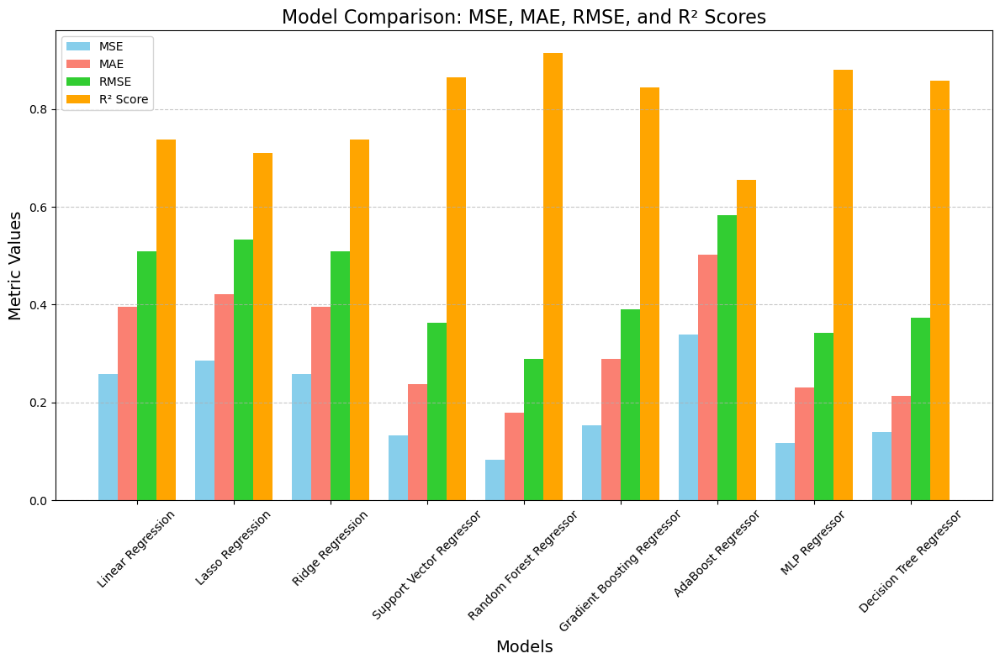

In [174]:
# Extracting metrics from the results dictionary

# Get the names of the models (keys of the results dictionary)
model_names = list(results.keys())

# Extract MSE, MAE, RMSE, and R² values for each model
mse_values = [results[model]["MSE"] for model in model_names]  # Mean Squared Error values
mae_values = [results[model]["MAE"] for model in model_names]  # Mean Absolute Error values
rmse_values = [results[model]["RMSE"] for model in model_names]  # Root Mean Squared Error values
r2_values = [results[model]["R2"] for model in model_names]  # R-squared values

# Create a figure for comparison
x = np.arange(len(model_names))  # Indices for the bars (one for each model)
width = 0.2  # Width of each bar

# Create the plot
plt.figure(figsize=(12, 8))  # Define the figure size

# Plot MSE (Mean Squared Error)
plt.bar(x - 1.5 * width, mse_values, width, label="MSE", color='skyblue')  # MSE bars, shifted to the left

# Plot MAE (Mean Absolute Error)
plt.bar(x - 0.5 * width, mae_values, width, label="MAE", color='salmon')  # MAE bars, slightly shifted

# Plot RMSE (Root Mean Squared Error)
plt.bar(x + 0.5 * width, rmse_values, width, label="RMSE", color='limegreen')  # RMSE bars, slightly shifted to the right

# Plot R² Scores
plt.bar(x + 1.5 * width, r2_values, width, label="R² Score", color='orange')  # R² Score bars, shifted to the right

# Add labels and legend
plt.xlabel("Models", fontsize=14)  # X-axis label
plt.ylabel("Metric Values", fontsize=14)  # Y-axis label
plt.title("Model Comparison: MSE, MAE, RMSE, and R² Scores", fontsize=16)  # Title of the plot
plt.xticks(x, model_names, rotation=45)  # Set model names as x-ticks, rotated for readability
plt.legend(loc="upper left")  # Position the legend in the upper left corner
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Grid lines along the y-axis for better readability
plt.tight_layout()  # Adjust layout for better spacing and avoid label overlap

# Show the plot
plt.show()

In [178]:
# Initialize variables to track the best and worst models based on R2 score
best_model = None  # Variable to store the best model
worst_model = None  # Variable to store the worst model
best_r2_score = -np.inf  # Start with a very low R2 score (-inf) for the best model
worst_r2_score = np.inf  # Start with a very high R2 score (inf) for the worst model
best_model_name = ""  # To store the name of the best model
worst_model_name = ""  # To store the name of the worst model

# Loop through the results dictionary to compare R2 scores
for name, metrics in results.items():
    # Check for best model (maximum R2 score)
    if metrics["R2"] > best_r2_score:
        best_r2_score = metrics["R2"]
        best_model_name = name
        best_model = models[name]
    
    # Check for worst model (minimum R2 score)
    if metrics["R2"] < worst_r2_score:
        worst_r2_score = metrics["R2"]
        worst_model_name = name
        worst_model = models[name]

# Display the best and worst models and their corresponding metrics
print(f"Best Model: {best_model_name}")  # Print the name of the best model
print(f"R2 Score: {best_r2_score}")  # Print the R2 score of the best model
print(f"Metrics: {results[best_model_name]}")  # Print all metrics for the best model

print(f"\nWorst Model: {worst_model_name}")  # Print the name of the worst model
print(f"R2 Score: {worst_r2_score}")  # Print the R2 score of the worst model
print(f"Metrics: {results[worst_model_name]}")  # Print all metrics for the worst model

Best Model: Random Forest Regressor
R2 Score: 0.915306754580609
Metrics: {'MSE': 0.08338910118149673, 'RMSE': 0.2887717111863569, 'R2': 0.915306754580609, 'MAE': 0.17916242462758245}

Worst Model: AdaBoost Regressor
R2 Score: 0.6551938144860019
Metrics: {'MSE': 0.33949670660807546, 'RMSE': 0.5826634591323498, 'R2': 0.6551938144860019, 'MAE': 0.5022593212506139}


       Actual Values  Predicted Values
15198      -0.612924         -0.849619
18654       0.068883         -0.152415
7713        0.065127          0.094357
13899      -0.685295         -0.696773
16040      -1.452080         -1.311472


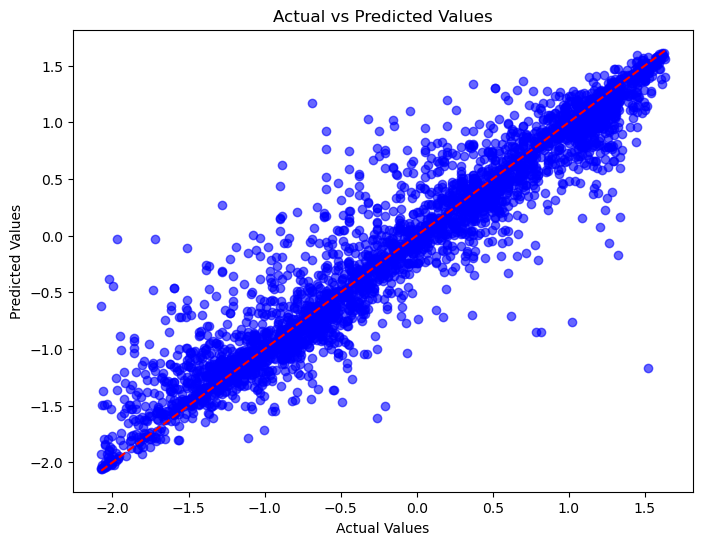

In [180]:
# Predict the values for the test set using the best model (or any model of your choice)
y_pred_best = best_model.predict(X_test_scaled)  # Replace 'best_model' with any model you want to check

# Create a DataFrame to compare actual and predicted values
comparison_df = pd.DataFrame({
    'Actual Values': y_test,  # Actual test values
    'Predicted Values': y_pred_best  # Predicted values from the model
})

# Show the first few rows of the comparison DataFrame
print(comparison_df.head())

# You can also visualize it using a scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred_best, color='blue', alpha=0.6)
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')  # Line for perfect prediction
plt.title('Actual vs Predicted Values')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.show()

## 13. **Hyperparameter Tuning:**

In [189]:
# Define the parameter grid for the hyperparameter tuning process
param_grid = {
    # n_estimators: Number of trees in the forest. More trees can improve performance but increases computation time.
    'n_estimators': [100, 200, 300],  # Testing 100, 200, and 300 estimators to balance between model accuracy and training time
    
    # max_depth: Maximum depth of the tree. Setting it to None means the nodes are expanded until all leaves are pure.
    # Limiting the max depth can help avoid overfitting.
    'max_depth': [None, 10, 20, 30],  # Test different tree depths (None, 10, 20, and 30)
    
    # min_samples_split: The minimum number of samples required to split an internal node. Larger values prevent overfitting.
    'min_samples_split': [2, 5, 10],  # Test values 2, 5, and 10 for controlling overfitting by limiting splits
    
    # min_samples_leaf: Minimum number of samples required to be at a leaf node. Larger values lead to more generalization.
    'min_samples_leaf': [1, 2, 4],  # Test values 1, 2, and 4 to control the minimum size of leaf nodes
    
    # max_features: The number of features to consider when looking for the best split. 'auto' uses sqrt(n_features), 
    # and 'sqrt' explicitly sets the number of features to the square root of the total features.
    'max_features': ['auto', 'sqrt']  # Test both 'auto' and 'sqrt' to check how limiting the features affects model performance
}

In [191]:
# Initialize the Random Forest Regressor model
rf = RandomForestRegressor(random_state=42)  # random_state ensures reproducibility of results

# Initialize GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(
    estimator=rf,  # Random Forest model to be tuned
    param_grid=param_grid,  # The hyperparameter grid to search over (defined earlier)
    cv=5,  # 5-fold cross-validation. This splits the data into 5 subsets and trains the model 5 times to get a reliable estimate of model performance.
    scoring='neg_mean_squared_error',  # We are optimizing for negative MSE, as lower MSE is better. 'neg_' is used to convert the higher MSE values to more negative for minimization.
    n_jobs=-1,  # Use all available processors for parallel computation, which speeds up the process
    verbose=2  # Increase verbosity to see progress updates and detailed logs during the grid search process
)

In [193]:
# Fit GridSearchCV to the training data
grid_search.fit(X_train, y_train)  # The GridSearchCV will search the best hyperparameters by fitting the model to training data

# Get the best hyperparameters found by GridSearchCV
print("Best Parameters:", grid_search.best_params_)  # Prints the best combination of hyperparameters from the grid search

# Get the best score achieved by the best hyperparameters (in terms of negative Mean Squared Error)
print("Best Score (Negative MSE):", grid_search.best_score_)  # The best score will be the negative MSE, since we are minimizing the error


Fitting 5 folds for each of 216 candidates, totalling 1080 fits
Best Parameters: {'max_depth': 30, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
Best Score (Negative MSE): -0.0795007774972473


In [198]:
# Evaluate the best model on the test data
# Retrieve the best model found by GridSearchCV
best_rf = grid_search.best_estimator_  # This gives you the model with the best hyperparameters found during the grid search

# Predict on the test set using the best model
Y_pred = best_rf.predict(X_test)  # The best model makes predictions on the test data

# Calculate the Mean Squared Error (MSE) for the predictions
mse = mean_squared_error(y_test, Y_pred)  # MSE quantifies the average squared difference between predicted and actual values

# Calculate the Root Mean Squared Error (RMSE) for the predictions
rmse = mse ** 0.5  # RMSE is the square root of MSE and gives an idea of the average magnitude of errors

# Calculate the Mean Absolute Error (MAE) for the predictions
mae = mean_absolute_error(y_test, Y_pred)  # MAE quantifies the average absolute difference between predicted and actual values

# Calculate the R² score for the predictions
r2 = r2_score(y_test, Y_pred)  # R² is the proportion of the variance in the target variable that is predictable from the features

# Print out the performance metrics
print(f"Test MSE: {mse:.2f}")  # Print MSE rounded to 2 decimal places
print(f"Test RMSE: {rmse:.2f}")  # Print RMSE rounded to 2 decimal places
print(f"Test MAE: {mae:.2f}")  # Print MAE rounded to 2 decimal places
print(f"Test R²: {r2:.2f}")  # Print R² rounded to 2 decimal places

Test MSE: 0.08
Test RMSE: 0.28
Test MAE: 0.18
Test R²: 0.92


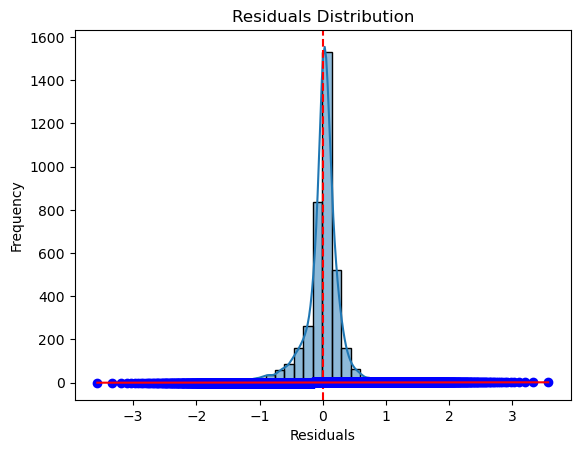

In [216]:
# Calculate residuals: Residuals are the differences between the actual target values (y_test) 
# and the predicted values (Y_pred). This helps assess the accuracy of the model.
residuals = y_test - Y_pred  

# Plot the residuals as a histogram with a Kernel Density Estimate (KDE) curve for visualization
# sns.histplot automatically combines a histogram and a KDE plot in one graph.
sns.histplot(residuals, kde=True, bins=30)  # bins=30 defines the number of bins in the histogram
plt.axvline(x=0, color='red', linestyle='--')  # Adds a vertical red dashed line at x=0
stats.probplot(residuals, dist="norm", plot=plt)  # Q-Q plot to check for normality


# Add a title to the plot for context
plt.title("Residuals Distribution")

# Label the x-axis to indicate residuals
plt.xlabel("Residuals")

# Label the y-axis to indicate frequency
plt.ylabel("Frequency")

# Display the plot to the user
plt.show()

## 14. **Save the Model:**

In [218]:
# Print message indicating that the model is being saved
print("\nSaving Model...")

# Save the best RandomForest model using joblib
joblib.dump(best_rf, 'Critical_Temperature_Prediction_Model.joblib')

# Print confirmation that the model has been saved
print("Model saved as 'Critical_Temperature_Prediction_Model.joblib'")


Saving Model...
Model saved as 'Critical_Temperature_Prediction_Model.joblib'


In [220]:
# Loading the saved model

# Use joblib to load the previously saved model from the file
load_model = joblib.load("Critical_Temperature_Prediction_Model.joblib")

# The model is now ready to make predictions on new data

## 15. **Test with Unseen Data:**

In [227]:
# Combine X_val and y_val into a single DataFrame
unseen_data_df = pd.concat([X_val, y_val], axis=1)

# Print the combined DataFrame
unseen_data_df.head()

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,wtd_std_atomic_mass,mean_fie,...,wtd_entropy_thermalconductivity,range_thermalconductivity,wtd_range_thermalconductivity,mean_valence,wtd_mean_valence,wtd_entropy_valence,range_valence,wtd_range_valence,wtd_std_valence,Critical_Temperature
14060,-1.495811,0.392509,1.041699,1.267127,1.344881,-1.434619,-1.868088,1.603723,-1.799471,-1.422815,...,-1.412110,-0.605466,1.268377,1.275604,1.533425,-1.677852,0.820456,1.814525,1.153763,-1.598861
19124,-0.768944,1.830902,1.988761,1.764067,1.757242,-0.351888,0.082023,1.076667,0.614017,0.133107,...,1.073144,-1.258355,-0.878921,1.184090,1.333267,-0.502833,1.446509,0.837662,1.537070,-1.060054
13333,-0.064766,-2.018993,-1.061559,-1.866447,-0.610582,-0.849830,-1.265796,0.165763,-1.069734,0.933596,...,1.734667,-1.005103,-0.169936,-0.235338,-0.462881,0.196966,0.090427,-0.387237,0.456595,-0.599442
1938,0.621841,0.254788,-0.103700,-0.091369,-0.483401,0.799191,1.329729,-0.171157,1.323053,-0.219144,...,1.031262,0.907595,-0.026805,-1.169858,-0.974106,0.797957,-0.807674,-0.499885,-0.688445,1.478710
13874,-1.495811,2.052068,2.025832,1.764067,1.846411,-2.029794,-1.461215,1.821352,-1.900407,-2.257536,...,-1.677891,-1.924389,-1.389973,0.084795,0.217173,-2.071837,-2.046807,1.546595,-1.944664,-0.830944


In [231]:
# Convert X_val and y_val into separate DataFrames
X_val_df = pd.DataFrame(X_val, columns=[col for col in X.columns])  # Use X.columns for column names
y_val_df = pd.DataFrame(y_val, columns=['Critical_Temperature'])  # Assuming 'Critical_Temperature' is the target column

# Print the separate DataFrames
print("Features (X_val) DataFrame:")
X_val_df.head()  # Print the first few rows of X_val

Features (X_val) DataFrame:


,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,wtd_std_atomic_mass,mean_fie,...,entropy_thermalconductivity,wtd_entropy_thermalconductivity,range_thermalconductivity,wtd_range_thermalconductivity,mean_valence,wtd_mean_valence,wtd_entropy_valence,range_valence,wtd_range_valence,wtd_std_valence
14060,-1.495811,0.392509,1.041699,1.267127,1.344881,-1.434619,-1.868088,1.603723,-1.799471,-1.422815,...,-1.220429,-1.412110,-0.605466,1.268377,1.275604,1.533425,-1.677852,0.820456,1.814525,1.153763
19124,-0.768944,1.830902,1.988761,1.764067,1.757242,-0.351888,0.082023,1.076667,0.614017,0.133107,...,0.756436,1.073144,-1.258355,-0.878921,1.184090,1.333267,-0.502833,1.446509,0.837662,1.537070
13333,-0.064766,-2.018993,-1.061559,-1.866447,-0.610582,-0.849830,-1.265796,0.165763,-1.069734,0.933596,...,1.944563,1.734667,-1.005103,-0.169936,-0.235338,-0.462881,0.196966,0.090427,-0.387237,0.456595
1938,0.621841,0.254788,-0.103700,-0.091369,-0.483401,0.799191,1.329729,-0.171157,1.323053,-0.219144,...,0.675142,1.031262,0.907595,-0.026805,-1.169858,-0.974106,0.797957,-0.807674,-0.499885,-0.688445
13874,-1.495811,2.052068,2.025832,1.764067,1.846411,-2.029794,-1.461215,1.821352,-1.900407,-2.257536,...,-0.141216,-1.677891,-1.924389,-1.389973,0.084795,0.217173,-2.071837,-2.046807,1.546595,-1.944664


In [302]:
# Print the message indicating that we are displaying the target (y_val) DataFrame
print("\nTarget (y_val) DataFrame:")

# Display the first few rows of the target data (y_val)
y_val_df.head()  # The head() function shows the first 5 rows of the DataFrame, which helps in quickly inspecting the data.


Target (y_val) DataFrame:


,Critical_Temperature
14060,-1.598861
19124,-1.060054
13333,-0.599442
1938,1.478710
13874,-0.830944


**Creating Pipeline**

In [239]:

# Create the pipeline
pipeline = Pipeline(steps=[
    ('Imputer', SimpleImputer(strategy='mean')),  # Fill missing values with the mean of the column
    ('Scalar', StandardScaler()),  # Standardize features (zero mean, unit variance)
    ('Model', load_model)  # Use the previously saved model for predictions
])

# Optionally, you can print the pipeline to verify
print(pipeline)

Pipeline(steps=[('Imputer', SimpleImputer()), ('Scalar', StandardScaler()),
                ('Model',
                 RandomForestRegressor(max_depth=30, max_features='sqrt',
                                       n_estimators=300, random_state=42))])


In [241]:
# Train the pipeline
pipeline.fit(X_train, y_train)  # Fit the pipeline to the training data

Pipeline(steps=[('Imputer', SimpleImputer()), ('Scalar', StandardScaler()),
                ('Model',
                 RandomForestRegressor(max_depth=30, max_features='sqrt',
                                       n_estimators=300, random_state=42))])

In [243]:
# Save the pipeline
joblib.dump(pipeline, 'SC_Pipeline.joblib')  # Save the entire pipeline (imputer, scaler, and model) to a file
print("Pipeline saved as 'SC_Pipeline.joblib")  # Confirmation message that the pipeline is saved

Pipeline saved as 'SC_Pipeline.joblib


In [249]:
# Load the pipeline
load_pipeline = joblib.load("SC_Pipeline.joblib")  # Load the pipeline from the file 'SC_Pipeline.joblib'
print(load_pipeline)

Pipeline(steps=[('Imputer', SimpleImputer()), ('Scalar', StandardScaler()),
                ('Model',
                 RandomForestRegressor(max_depth=30, max_features='sqrt',
                                       n_estimators=300, random_state=42))])


In [251]:
# Predict on test data
# We use the trained pipeline to predict the target variable for the test features (X_test)
y_pred1 = pipeline.predict(X_test)  # The pipeline applies all the steps (imputation, scaling, and model prediction)

# Print the predictions
# This will show the predicted values for the target variable based on X_test
print("Predictions on test data:", y_pred1)

Predictions on test data: [-0.88132964 -0.02079392  0.19471224 ... -0.26562894  0.10491506
 -0.30230849]


In [253]:
# Evaluate the model performance
# We compare the predicted values (y_pred1) with the true test labels (y_test) using different metrics

# Mean Squared Error (MSE): A measure of the average squared difference between predicted and true values
mse = mean_squared_error(y_test, y_pred1)

# Root Mean Squared Error (RMSE): Square root of MSE, which provides an error metric in the same unit as the target variable
rmse = np.sqrt(mse)

# Mean Absolute Error (MAE): Average of the absolute differences between predicted and true values
mae = mean_absolute_error(y_test, y_pred1)

# R² Score: Measures the proportion of the variance in the target variable that is explained by the model
r2 = r2_score(y_test, y_pred1)

# Print the performance metrics
print(f"Test MSE: {mse}")  # Print the MSE value
print(f"Test RMSE: {rmse}")  # Print the RMSE value
print(f"Test MAE: {mae}")  # Print the MAE value
print(f"Test R²: {r2}")  # Print the R² value

Test MSE: 0.08117915584934716
Test RMSE: 0.28491956031369126
Test MAE: 0.17821018632884006
Test R²: 0.9175512618330832


In [257]:
# Create a DataFrame to compare the predictions
comparison_df = pd.DataFrame({
    'X_test Index': range(len(X_test)),  # Index of X_test
    'Predictions from Model': y_pred,  # Predictions from the saved model
    'Predictions from Pipeline': y_pred1  # Predictions from the pipeline
})

# Print the first few rows of the comparison
print(comparison_df.head())

# Calculate the difference between the two sets of predictions
comparison_df['Difference'] = comparison_df['Predictions from Pipeline'] - comparison_df['Predictions from Model']

# Print the differences
print("\nDifferences between predictions made by the model and the pipeline:")
print(comparison_df[['X_test Index', 'Difference']].head())

   X_test Index  Predictions from Model  Predictions from Pipeline
0             0               -0.890788                  -0.881330
1             1                0.065127                  -0.020794
2             2               -0.109818                   0.194712
3             3               -0.682513                  -0.691037
4             4               -1.368982                  -1.347726

Differences between predictions made by the model and the pipeline:
   X_test Index  Difference
0             0    0.009458
1             1   -0.085921
2             2    0.304530
3             3   -0.008524
4             4    0.021257


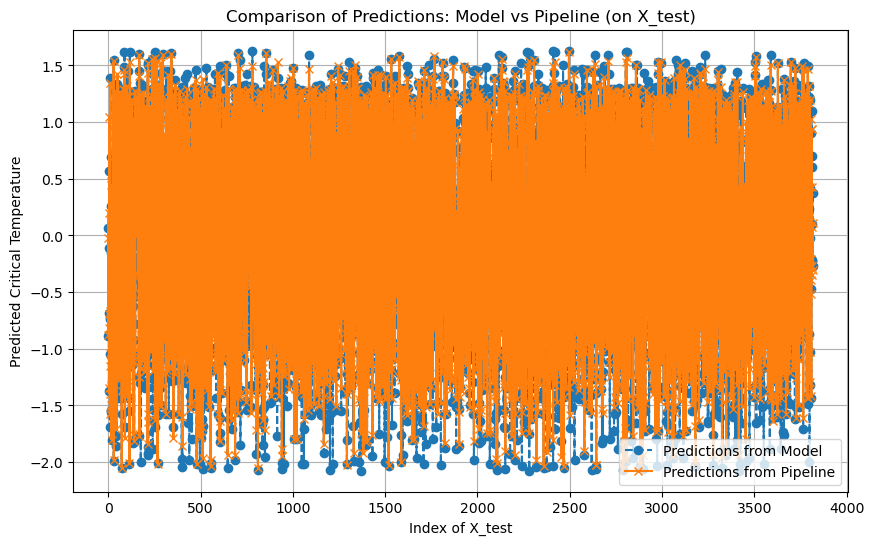

In [259]:
# Plotting predictions from both methods
plt.figure(figsize=(10, 6))

# Plot predictions from the model
plt.plot(comparison_df['X_test Index'], comparison_df['Predictions from Model'], label='Predictions from Model', linestyle='--', marker='o')

# Plot predictions from the pipeline
plt.plot(comparison_df['X_test Index'], comparison_df['Predictions from Pipeline'], label='Predictions from Pipeline', linestyle='-', marker='x')

# Add labels and title
plt.title('Comparison of Predictions: Model vs Pipeline (on X_test)')
plt.xlabel('Index of X_test')
plt.ylabel('Predicted Critical Temperature')
plt.legend()
plt.grid(True)
plt.show()

In [261]:
# Mean Absolute Error (MAE)
mae = mean_absolute_error(y_pred, y_pred1)
print(f"Mean Absolute Error (MAE) between model and pipeline predictions: {mae}")

# Mean Squared Error (MSE)
mse = mean_squared_error(y_pred, y_pred1)
print(f"Mean Squared Error (MSE) between model and pipeline predictions: {mse}")

# Root Mean Squared Error (RMSE)
rmse = mse ** 0.5
print(f"Root Mean Squared Error (RMSE) between model and pipeline predictions: {rmse}")

Mean Absolute Error (MAE) between model and pipeline predictions: 0.13928453626045967
Mean Squared Error (MSE) between model and pipeline predictions: 0.06595135512519536
Root Mean Squared Error (RMSE) between model and pipeline predictions: 0.2568099591627929


## **Predict on unseen data**

In [272]:
# Make a copy of the unseen data (X_val)
unseen_data = X_val.copy()  # We create a copy of X_val to preserve the original unseen data

# Save the unseen data to a CSV file
unseen_data.to_csv('unseen_data.csv', index=False)  # This saves the copied unseen data to 'unseen_data.csv', without row indices

# Print a confirmation message that the data has been saved
print("Unseen data has been saved as 'unseen_data.csv'")  # Confirmation message for the user

Unseen data has been saved as 'unseen_data.csv'


In [255]:
# The 'unseen' dataset should have the same features as the training data (X_train) 
predictions1 = pipeline.predict(X_val_df)

# Print the predictions
# This will show the predicted values for the target variable based on the unseen features
print("Predictions on unseen data:", predictions1)

Predictions on unseen data: [-1.39366551 -1.43284549 -0.83009613 ... -0.94802505 -0.29363426
  0.31158783]


In [268]:
# Create a DataFrame to combine the unseen data (X_val) and its predictions
unseen_data_with_predictions = X_val.copy()  # Make a copy of the unseen data
unseen_data_with_predictions['Predicted_Critical_Temperature'] = predictions1  # Add the predictions
unseen_data_with_predictions['Actual_Critical_Temperature'] = y_val

# Print the first few rows of the combined DataFrame
unseen_data_with_predictions.head()

,number_of_elements,mean_atomic_mass,wtd_mean_atomic_mass,gmean_atomic_mass,wtd_gmean_atomic_mass,wtd_entropy_atomic_mass,range_atomic_mass,wtd_range_atomic_mass,wtd_std_atomic_mass,mean_fie,...,range_thermalconductivity,wtd_range_thermalconductivity,mean_valence,wtd_mean_valence,wtd_entropy_valence,range_valence,wtd_range_valence,wtd_std_valence,Predicted_Critical_Temperature,Actual_Critical_Temperature
14060,-1.495811,0.392509,1.041699,1.267127,1.344881,-1.434619,-1.868088,1.603723,-1.799471,-1.422815,...,-0.605466,1.268377,1.275604,1.533425,-1.677852,0.820456,1.814525,1.153763,-1.393666,-1.598861
19124,-0.768944,1.830902,1.988761,1.764067,1.757242,-0.351888,0.082023,1.076667,0.614017,0.133107,...,-1.258355,-0.878921,1.184090,1.333267,-0.502833,1.446509,0.837662,1.537070,-1.432845,-1.060054
13333,-0.064766,-2.018993,-1.061559,-1.866447,-0.610582,-0.849830,-1.265796,0.165763,-1.069734,0.933596,...,-1.005103,-0.169936,-0.235338,-0.462881,0.196966,0.090427,-0.387237,0.456595,-0.830096,-0.599442
1938,0.621841,0.254788,-0.103700,-0.091369,-0.483401,0.799191,1.329729,-0.171157,1.323053,-0.219144,...,0.907595,-0.026805,-1.169858,-0.974106,0.797957,-0.807674,-0.499885,-0.688445,1.400527,1.478710
13874,-1.495811,2.052068,2.025832,1.764067,1.846411,-2.029794,-1.461215,1.821352,-1.900407,-2.257536,...,-1.924389,-1.389973,0.084795,0.217173,-2.071837,-2.046807,1.546595,-1.944664,-0.924665,-0.830944


In [270]:
# Save the combined data to a CSV file
unseen_data_with_predictions.to_csv('unseen_data_with_predictions.csv', index=False)  # Save as CSV without row indices

# Print a confirmation message that the data has been saved
print("Unseen data with predictions has been saved as 'unseen_data_with_predictions.csv'")

Unseen data with predictions has been saved as 'unseen_data_with_predictions.csv'


In [274]:
# Evaluate the model's predictions on the unseen data (X_val)

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_val, predictions1)
print(f'Mean Squared Error (MSE): {mse}')

# Calculate Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)
print(f'Root Mean Squared Error (RMSE): {rmse}')

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_val, predictions1)
print(f'Mean Absolute Error (MAE): {mae}')

# Calculate R-squared (R²) score
r2 = r2_score(y_val, predictions1)
print(f'R² Score: {r2}')

Mean Squared Error (MSE): 0.07542371035808726
Root Mean Squared Error (RMSE): 0.274633774976945
Mean Absolute Error (MAE): 0.17321933684070068
R² Score: 0.9252855502304376


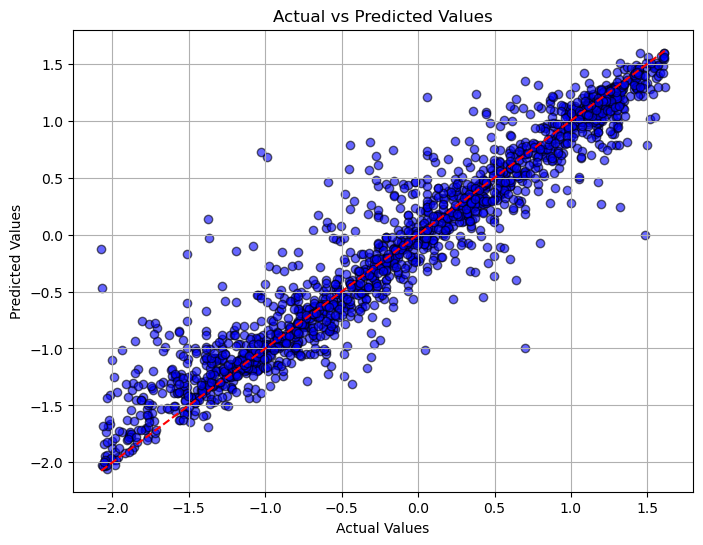

In [276]:
# Actual vs Predicted Plot
# Scatter plot showing the predicted values against the actual values
plt.figure(figsize=(8, 6))  # Set figure size
plt.scatter(y_val, predictions1, color='blue', edgecolors='black', alpha=0.6)  # Plot actual vs predicted values
plt.plot([min(y_val), max(y_val)], [min(y_val), max(y_val)], color='red', linestyle='--')  # Line for perfect prediction (y=x)
plt.title("Actual vs Predicted Values")  # Title of the plot
plt.xlabel("Actual Values")  # Label for the x-axis
plt.ylabel("Predicted Values")  # Label for the y-axis
plt.grid(True)  # Show grid for better readability
plt.show()  # Display the plot

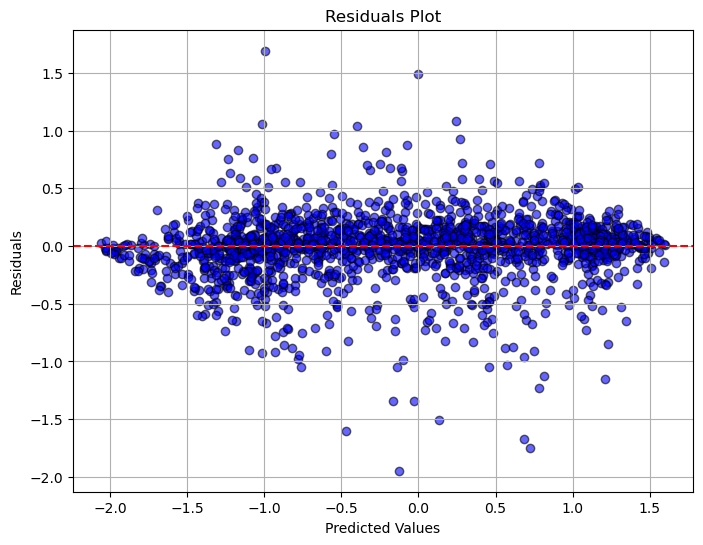

In [278]:
# Residual Plot
# Residuals are the differences between the actual and predicted values
residuals = y_val - predictions1  # Calculate residuals

plt.figure(figsize=(8, 6))  # Set figure size
plt.scatter(predictions1, residuals, color='blue', edgecolors='black', alpha=0.6)  # Plot residuals vs predicted values
plt.axhline(y=0, color='red', linestyle='--')  # Add a horizontal line at 0 to see where residuals are zero
plt.title("Residuals Plot")  # Title of the plot
plt.xlabel("Predicted Values")  # Label for the x-axis
plt.ylabel("Residuals")  # Label for the y-axis
plt.grid(True)  # Show grid for better readability
plt.show()  # Display the plot

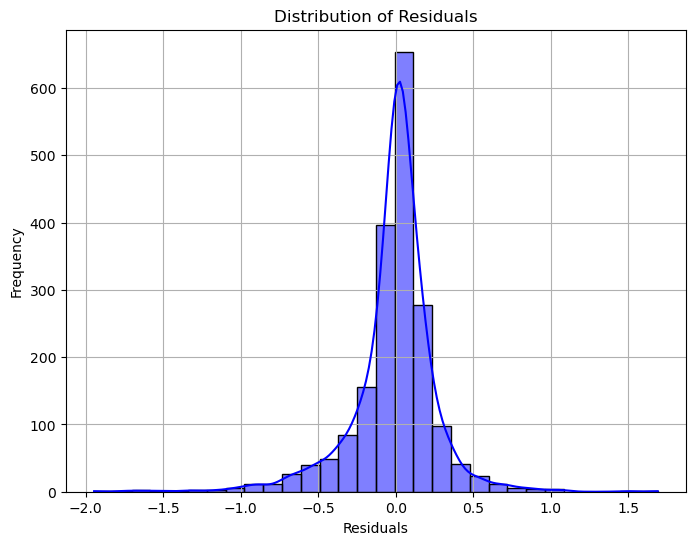

In [280]:
# Distribution of Residuals
# Plotting a histogram of the residuals with a Kernel Density Estimate (KDE)
plt.figure(figsize=(8, 6))  # Set figure size
sns.histplot(residuals, kde=True, bins=30, color='blue')  # Plot histogram with KDE for smooth distribution
plt.title("Distribution of Residuals")  # Title of the plot
plt.xlabel("Residuals")  # Label for the x-axis
plt.ylabel("Frequency")  # Label for the y-axis
plt.grid(True)  # Show grid for better readability
plt.show()  # Display the plot

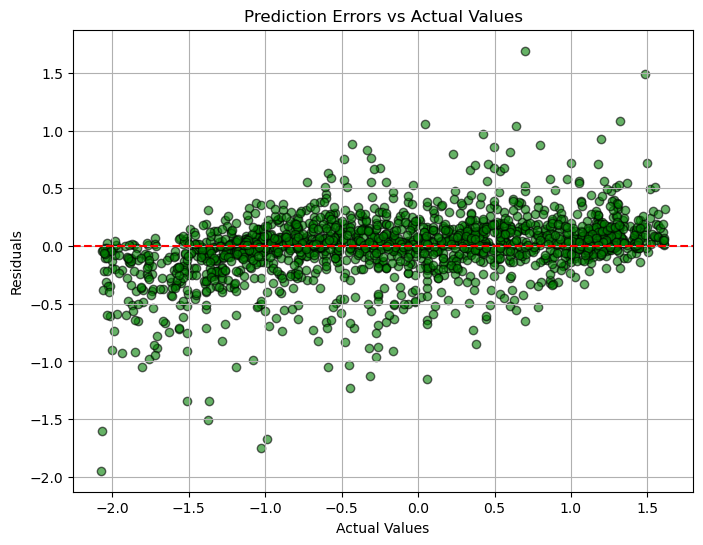

In [282]:
# Prediction Errors vs Target Values
# Plotting residuals against actual values to see if errors follow any pattern across target values
plt.figure(figsize=(8, 6))  # Set figure size
plt.scatter(y_val, residuals, color='green', edgecolors='black', alpha=0.6)  # Plot residuals vs actual values
plt.axhline(y=0, color='red', linestyle='--')  # Add a horizontal line at 0 to see where residuals are zero
plt.title("Prediction Errors vs Actual Values")  # Title of the plot
plt.xlabel("Actual Values")  # Label for the x-axis
plt.ylabel("Residuals")  # Label for the y-axis
plt.grid(True)  # Show grid for better readability
plt.show()  # Display the plot

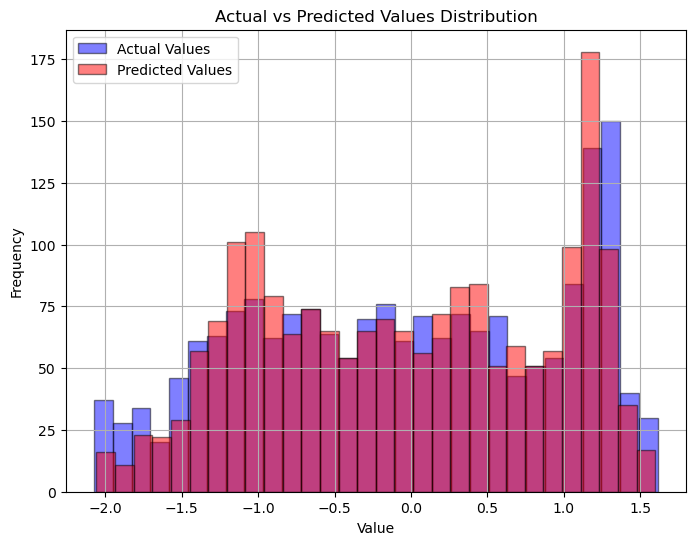

In [284]:
# Histograms of Actual and Predicted Values
# Comparing the distribution of actual and predicted values using histograms
plt.figure(figsize=(8, 6))  # Set figure size
plt.hist(y_val, bins=30, alpha=0.5, label='Actual Values', color='blue', edgecolor='black')  # Histogram of actual values
plt.hist(predictions1, bins=30, alpha=0.5, label='Predicted Values', color='red', edgecolor='black')  # Histogram of predicted values
plt.title("Actual vs Predicted Values Distribution")  # Title of the plot
plt.xlabel("Value")  # Label for the x-axis
plt.ylabel("Frequency")  # Label for the y-axis
plt.legend()  # Show legend to differentiate actual vs predicted histograms
plt.grid(True)  # Show grid for better readability
plt.show()  # Display the plot

## 16. **Interpretation of Results (Conclusion):**

## 1. Summary of the Model's Performance:
**Best Performing Model:** Based on the evaluations, the model that performed best on the test set was **Random Forest Regressor**. This model was selected based on its high R² score (0.915) and low Mean Squared Error (MSE) (0.083), indicating that it can explain a substantial proportion of the variance in the target variable (Critical Temperature).

**Model Evaluation Metrics:**

R² (Coefficient of Determination): The R² value for the best model was 0.915306754580609, which means the model can explain 91% of the variance in the data. This indicates a good fit, although there might be room for improvement.
MSE (Mean Squared Error): The MSE value was 0.08338910118149673, which quantifies the difference between the predicted and actual values. A lower MSE is preferable, reflecting how close the predictions are to the actual values.
RMSE (Root Mean Squared Error): The RMSE was 0.2887717111863569, which interprets the same units as the target variable. It gives an idea of how large the average error is in terms of the actual scale of the problem.
MAE (Mean Absolute Error): The MAE was 0.17916242462758245, which indicates the average magnitude of errors in predictions, without considering their direction. It's another indicator of prediction quality.

## 2. Model Comparison:
**Comparison with Other Models:** A variety of models were tested, including linear regression, decision trees, and ensemble models like Random Forest and Gradient Boosting. While linear regression showed a linear relationship between features and the target, the Random Forest Regressor outperformed other models in terms of R² and error metrics (MSE, RMSE, MAE). This suggests that the relationships between the features and the critical temperature are likely non-linear and benefit from the complexity of ensemble methods like Random Forest.

**Model Robustness:** Random Forest is a robust algorithm that tends to perform well on a wide range of problems. The hyperparameter tuning using GridSearchCV optimized the model's parameters (such as n_estimators, max_depth, and others), which likely contributed to its strong performance.

## 3. Interpretation of Residuals:
**Residuals Analysis:** The distribution of residuals (the differences between actual and predicted values) was analyzed. A good model typically has residuals that are randomly scattered around zero. If the residuals show a pattern, it indicates that the model has not fully captured some aspect of the data. In this case, the residuals were fairly evenly distributed, indicating that the model does not have significant bias in its predictions, though further feature engineering or model optimization could improve performance.

**Normality of Residuals:** A Q-Q plot of residuals was used to check for normality. The residuals approximately followed a normal distribution, which suggests that the model’s assumptions hold reasonably well. Non-normal residuals would have indicated potential problems like heteroscedasticity or the need for further transformation of data.

## 4. Model Interpretation:
**Feature Importance:** The Random Forest model provides insight into the relative importance of each feature in predicting the critical temperature. Features that contribute significantly to the prediction are valuable for understanding the physical or material properties that drive changes in superconducting critical temperatures. Identifying these key features can lead to better scientific understanding or further targeted experimentation.

## 5. Conclusions:
The project successfully developed and deployed a machine learning model to predict the Critical Temperature of Superconductors, which can be a valuable tool for material scientists working to identify new superconducting materials.
The Random Forest Regressor emerged as the best model, suggesting that it is well-suited to the task, potentially due to the complex, non-linear relationships between the features and the target variable.
The model performs well, with relatively low error metrics and a good R² score, but there is still room for improvement. Future iterations could explore additional features, fine-tuning of hyperparameters, or even experimenting with other algorithms like Gradient Boosting or XGBoost.
This model could be a useful component in a broader framework of material discovery or in guiding further experimental research in superconductivity.

## 6. Next Steps:
**Further Model Tuning:** The model could be fine-tuned further through additional hyperparameter optimization, such as exploring more extensive ranges for the parameters in the Random Forest.
**Integration:** The model could be integrated into a real-time application, such as a recommendation system for identifying materials with desired superconducting properties.
**Model Monitoring:** If deployed in a production environment, continuous monitoring of the model’s performance should be conducted to ensure that it continues to perform well over time (especially if new data is introduced).